# Sprawozdanie z tematu Sieci Neuronowe 
### Wiktor Wierzchowski 320667

Poniższe sprawozdanie jest podsumowaniem pracy implementacyjnej oraz wyników doświadczeń przeprowadzonych w obszarze sieci neuronowych. 
W ramach tego obszaru poruszone zostały następujące problemy.

## 1. Bazowa implementacja
Wykonanie podstawowych funkcji i klasy sieci neuronowej. Mając do dyspozycji funkcję ręcznie ustalającą parametry sieci, obliczanie błędu MSE oraz wykonywanie propagacji w przód, możemy już próbować ręcznie dobierać parametry sieci w celu znalezienia optymalnej konfiguracji.

In [ ]:
# implementacja NN1

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import networkx as nx

def sigmoid(x):
	return 1/(1+np.e**(-x))

def linear(x):
	return x

class network:
	def __init__(self):
		pass

	def set_state(self, architecture, biases, weights, activations):
		self.architecture = architecture
		self.biases = biases
		self.weights = weights
		self.activations = activations
		
	def forward(self, X):
		for i in range(0, len(self.architecture)-1):
			X = self.activations[i](np.dot(X, self.weights[i]) + self.biases[i])
		
		return X
	
	def check_MSE(self, y, y_pred):
		return np.mean((y - y_pred) ** 2)
	
	def visualize_network(self):
		G = nx.DiGraph()
		pos = {}
		edge_colors = []
		edge_widths = []
		
		for layer_idx, num_nodes in enumerate(self.architecture):
			for node_idx in range(num_nodes):
				node_name = f"L{layer_idx}_N{node_idx}"
				pos[node_name] = (layer_idx, -node_idx)  
				G.add_node(node_name)
				
				if layer_idx > 0: 
					for prev_idx in range(self.architecture[layer_idx - 1]):
						prev_name = f"L{layer_idx-1}_N{prev_idx}"
						weight = self.weights[layer_idx-1][prev_idx][node_idx]

						if weight != 0:
							G.add_edge(prev_name, node_name)
							edge_colors.append('red' if weight < 0 else 'green')
							edge_widths.append(np.log(abs(weight)))
		
		plt.figure(figsize=(10, 5))
		nx.draw(G, pos, with_labels=True, node_size=700, node_color="skyblue", edge_color=edge_colors, width=edge_widths)
		plt.show()

network_sl = network()
network_ss = network()

### STEPS LARGE

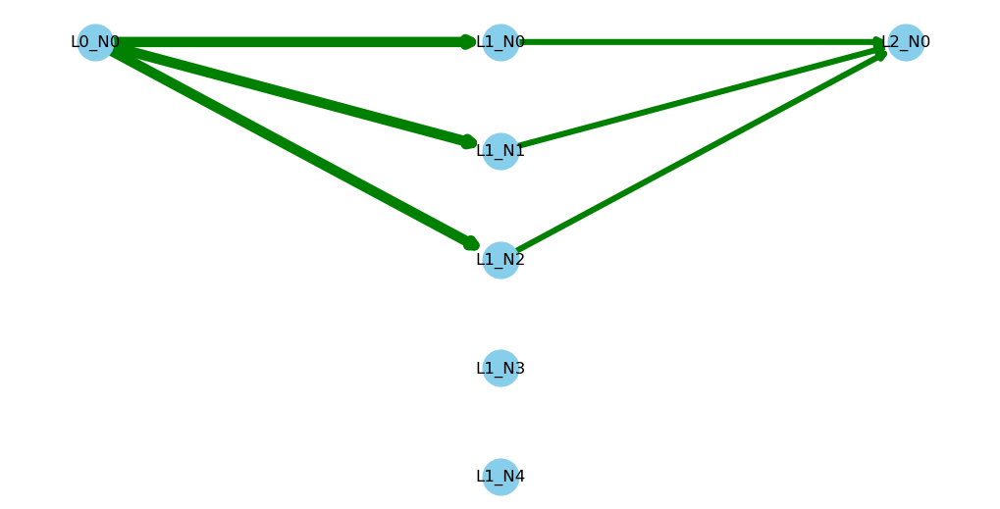

In [ ]:
architecture = np.array([1, 5, 1])
activations = [sigmoid, linear]

weights=[
    [[2000, 2000, 2000, 0, 0]],
    [[80], [80], [80], [0], [0]]
] 

biases=[
    [1000, -1000, -3000, 0, 0],
    [-80]
]

network_sl.set_state(architecture, biases, weights, activations)
network_sl.visualize_network()

weights=[
    [[2000, 2000, 2000, 0, 0]],
    [80, 80, 80, 0, 0]
] 
network_sl.set_state(architecture, biases, weights, activations)

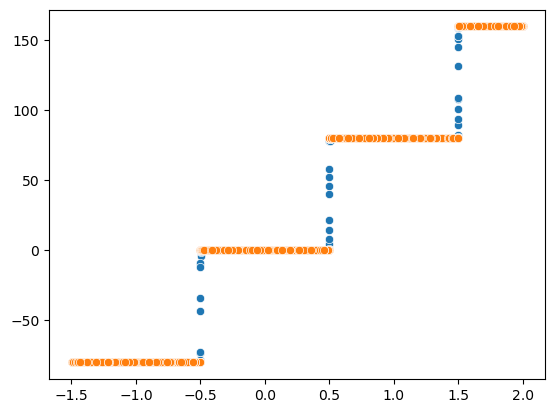

steps large weights [[[2000, 2000, 2000, 0, 0]], [80, 80, 80, 0, 0]]
steps large biases [[1000, -1000, -3000, 0, 0], [-80]]
steps large mse 1.1119852493764608


In [ ]:
sns.scatterplot(x=steps_large_train_X.ravel(), y=steps_large_train_Y_pred.ravel())
sns.scatterplot(x=steps_large_train_X, y=steps_large_train_Y)
plt.show()

print('steps large weights', network_sl.weights)
print('steps large biases', network_sl.biases)
print('steps large mse', network_sl.check_MSE(steps_large_train_Y, steps_large_train_Y_pred))

### SQUARE SIMPLE

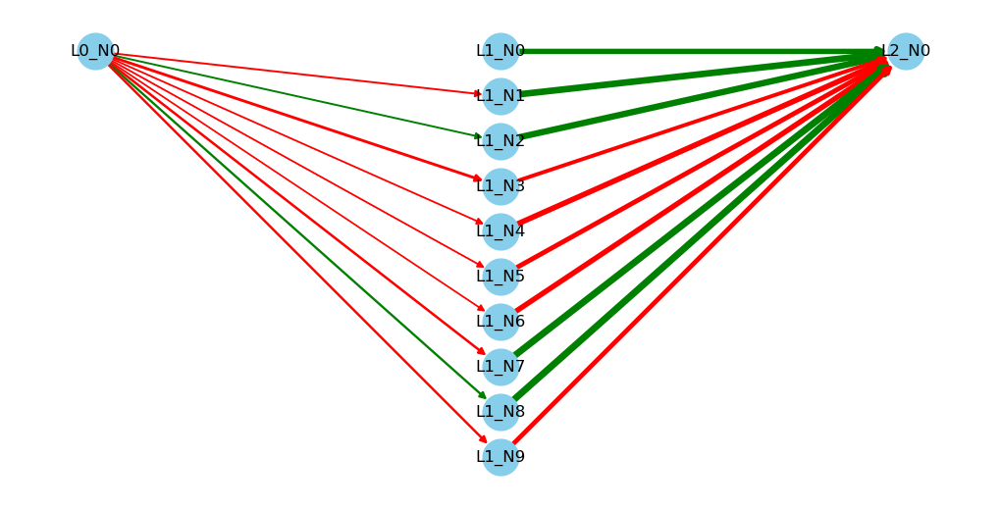

In [ ]:
architecture = np.array([1, 10, 1])
activations = [sigmoid, linear]

weights=[
    [[0, -4, 4, -8, -3.7, -3.7, -3.5, -6.2, 5.4, -5.7]],
    [[50.5], [122], [101.5], [-17], [-55], [-33.5], [-49.5], [139.7], [147.6], [-30.3]]
]

biases=[
    [2.5, -3.3, -4.8, 3, 6.5, 4.3, 5.8, -8.5, -10, 4],
    [1.5]
]

network_ss.set_state(architecture, biases, weights, activations)
network_ss.visualize_network()

weights=[
    [[0, -4, 4, -8, -3.7, -3.7, -3.5, -6.2, 5.4, -5.7]],
    [50.5, 122, 101.5, -17, -55, -33.5, -49.5, 139.7, 147.6, -30.3]
]

network_ss.set_state(architecture, biases, weights, activations)

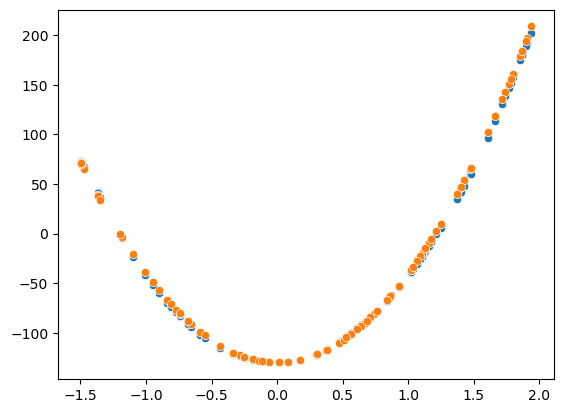

steps large weights [[[0, -4, 4, -8, -3.7, -3.7, -3.5, -6.2, 5.4, -5.7]], [50.5, 122, 101.5, -17, -55, -33.5, -49.5, 139.7, 147.6, -30.3]]
steps large biases [[2.5, -3.3, -4.8, 3, 6.5, 4.3, 5.8, -8.5, -10, 4], [1.5]]
steps large mse 7.762745551755081


In [ ]:
sns.scatterplot(x=square_simple_train_X.ravel(), y=square_simple_train_Y_pred.ravel())
sns.scatterplot(x=square_simple_train_X, y=square_simple_train_Y)
plt.show()

print('steps large weights', network_ss.weights)
print('steps large biases', network_ss.biases)
print('steps large mse', network_ss.check_MSE(square_simple_train_Y, square_simple_train_Y_pred))

### Wnioski
Po wprowadzeniu odpowiednich wag sieć poprawnie znajduje wartości na osi Y dla zadanych prostych funkcji.

## 2. Implementacja propagacji wstecznej błędu
Żeby sieć była użyteczna musi się też sama uczyć. Propagacja wstecz wykorzystuje informację o błędzie wyników jakie daje sieć w celu wyznaczenia ewentualnej poprawki parametrów która taki błąd by zmniejszyła. Możemy kontrolować po jakiej ilości próbek taki proces nastąpi jeśli przygotujemy losowe ich paczki po przez batchowanie. Na tych labach zaimplementowałem również inicjacje wag metodami he, xavier oraz uniform. Aby usprawnić proces uczenia dodałem również funkcjonalność standaryzacji danych w obrębie sieci.

In [ ]:
# implementacja NN2

def sigmoid(x):
	return 1/(1+np.e**(-x))

def sigmoid_derivative(x):
	return sigmoid(x) * (1 - sigmoid(x))

def linear(x):
	return x

def linear_derivative(x):
	return 1

class network:
	def __init__(self, architecture, activation_functions, activation_derivatives, initiation_method):
		self.architecture = architecture
		self.activation_functions = activation_functions
		self.activation_derivatives = activation_derivatives
		self.weights_biases_initiation(initiation_method)
		self.mse_record = []

	def set_state(self, architecture, biases, weights, activation_functions):
		self.architecture = architecture
		self.biases = biases
		self.weights = weights
		self.activation_functions = activation_functions

	def weights_biases_initiation(self, initiation_method):
		self.weights = [None]
		self.biases = [None]

		if initiation_method not in ['he', 'xavier', 'uniform']:
			print('Initiation method incorrect!')
			return 

		for i in range(len(self.architecture) - 1):
			input_dim = self.architecture[i]
			output_dim = self.architecture[i + 1]
			
			if initiation_method == 'he':
				weight_matrix = np.random.randn(input_dim, output_dim) * np.sqrt(2 / input_dim)
			elif initiation_method == 'xavier':
				weight_matrix = np.random.randn(input_dim, output_dim) * np.sqrt(1 / input_dim)
			elif initiation_method == 'uniform':
				weight_matrix = np.random.uniform(0, 1, (input_dim, output_dim))

			bias_vector = np.zeros((1, output_dim))
			
			self.weights.append(weight_matrix)
			self.biases.append(bias_vector)

	def forward(self, X):
		# as a convention, for convinience, zeroth index of activations is raw input, i add None to preactivations for uniform indexing
		self.activations = [X]
		self.preactivations = [None]

		for i in range(0, len(self.architecture)-1):
			z = np.dot(self.activations[i], self.weights[i+1]) + self.biases[i+1]
			self.preactivations.append(z)
			
			a = self.activation_functions[i+1](z)
			self.activations.append(a)
	
	def check_MSE(self, x, y):
		self.forward(x)
		prediction = self.destandardize_data(self.activations[-1], 'y')
		correct = self.destandardize_data(y, 'y')
		return np.mean((correct - prediction) ** 2)
	
	def visualize_network(self):
		G = nx.DiGraph()
		pos = {}
		edge_colors = []
		edge_widths = []
		
		for layer_idx, num_nodes in enumerate(self.architecture):
			for node_idx in range(num_nodes):
				node_name = f"L{layer_idx}_N{node_idx}"
				pos[node_name] = (layer_idx, -node_idx)  
				G.add_node(node_name)
				
				if layer_idx > 0: 
					for prev_idx in range(self.architecture[layer_idx - 1]):
						prev_name = f"L{layer_idx-1}_N{prev_idx}"
						weight = self.weights[layer_idx][prev_idx][node_idx]

						if weight != 0:
							G.add_edge(prev_name, node_name)
							edge_colors.append('red' if weight < 0 else 'green')
							edge_widths.append(np.log(abs(weight)))
		
		plt.figure(figsize=(10, 5))
		nx.draw(G, pos, with_labels=True, node_size=700, node_color="skyblue", edge_color=edge_colors, width=edge_widths)
		plt.show()

	def backward(self, Y, step):
		self.error = [None] * (len(self.weights))
		self.weights_gradient = [None] * (len(self.weights))
		self.biases_gradient = [None] * (len(self.weights))

		self.error[-1] = (self.activations[-1] - Y) * self.activation_derivatives[-1](self.preactivations[-1])
		for i in reversed(range(1, len(self.error) - 1)):
			self.error[i] = np.dot(self.error[i+1], self.weights[i+1].T) * self.activation_derivatives[i](self.preactivations[i])
		
		for i in range(1, len(self.error)):
			self.weights_gradient[i] = -step * np.dot(self.activations[i-1].T, self.error[i]) / self.error[i].shape[0]
			self.biases_gradient[i] = (-step * np.mean(self.error[i], axis=0)).reshape(1, -1)

	def prepeare_batches(self, data, batch_size=None):
		n = len(data)
		if batch_size == None:
			batch_number = 1
		else:
			batch_number = int(np.ceil(n / batch_size))

		data_shuffled = np.random.permutation(data)
		x = data_shuffled[:,0].reshape(n,1)
		y = data_shuffled[:,1].reshape(n,1)

		x = self.standardize_data(x, 'x')
		y = self.standardize_data(y, 'y')
		
		x = np.array_split(x, batch_number)
		y = np.array_split(y, batch_number)

		return x, y, batch_number
	
	def learn_old(self, x, y, step, iterations):
		x = self.standardize_data(x, 'x')
		y = self.standardize_data(y, 'y')

		for e in range(iterations):
			self.forward(x)
			self.backward(y, step)
			
			for i in range(1, len(self.architecture)):
					self.weights[i] += self.weights_gradient[i]
					self.biases[i] += self.biases_gradient[i]

			self.mse_record.append(self.check_MSE(x, y))

	def learn(self, data, epochs_number, step, batch_size=None):
		for e in range(epochs_number):
			x, y, batch_number = self.prepeare_batches(data, batch_size)

			for b in range(batch_number):
				self.forward(x[b])
				self.backward(y[b], step)

				for i in range(1, len(self.architecture)):
					self.weights[i] += self.weights_gradient[i]
					self.biases[i] += self.biases_gradient[i]

			self.mse_record.append(self.check_MSE(np.vstack(x), np.vstack(y)))

	def standardize_data(self, data, type):
		mean = np.mean(data, axis=0)
		std = np.std(data, axis=0)
		data_new = (data - mean) / std

		if type == 'x':
			self.standardize_params_x = (mean, std)
		if type == 'y':
			self.standardize_params_y = (mean, std)

		return data_new

	def destandardize_data(self, data, type):
		if type == 'x':
			return data * self.standardize_params_x[1] + self.standardize_params_x[0]
		if type == 'y':
			return data * self.standardize_params_y[1] + self.standardize_params_y[0]
		

### SQUARE SIMPLE

In [ ]:
network_ss_5_5 = network(np.array([1, 5, 1]), [None, sigmoid, linear], [None, sigmoid_derivative, linear_derivative], 'xavier')
network_ss_5_5.learn(square_simple_train, 5000, 0.075, 5)

network_ss_5_15 = network(np.array([1, 5, 1]), [None, sigmoid, linear], [None, sigmoid_derivative, linear_derivative], 'xavier')
network_ss_5_15.learn(square_simple_train, 5000, 0.075, 15)

network_ss_5_25 = network(np.array([1, 5, 1]), [None, sigmoid, linear], [None, sigmoid_derivative, linear_derivative], 'xavier')
network_ss_5_25.learn(square_simple_train, 5000, 0.075, 25)

network_ss_5_35 = network(np.array([1, 5, 1]), [None, sigmoid, linear], [None, sigmoid_derivative, linear_derivative], 'xavier')
network_ss_5_35.learn(square_simple_train, 5000, 0.075, 35)

Final mse batch 5:  2.8908642247023346
Final mse batch 15:  2.1232902768139468
Final mse batch 25:  3.1500110307728395
Final mse batch 35:  10.211137271766713


<Axes: >

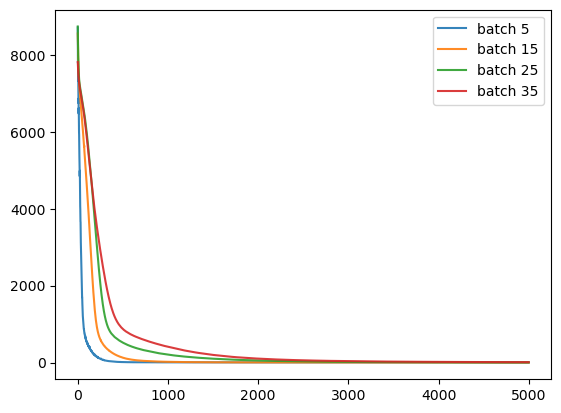

In [ ]:
print('Final mse batch 5: ', network_ss_5_5.mse_record[-1])
print('Final mse batch 15: ', network_ss_5_15.mse_record[-1])
print('Final mse batch 25: ', network_ss_5_25.mse_record[-1])
print('Final mse batch 35: ', network_ss_5_35.mse_record[-1])

sns.lineplot(network_ss_5_5.mse_record, alpha=0.9, label='batch 5')
sns.lineplot(network_ss_5_15.mse_record, alpha=0.9, label='batch 15')
sns.lineplot(network_ss_5_25.mse_record, alpha=0.9, label='batch 25')
sns.lineplot(network_ss_5_35.mse_record, alpha=0.9, label='batch 35')

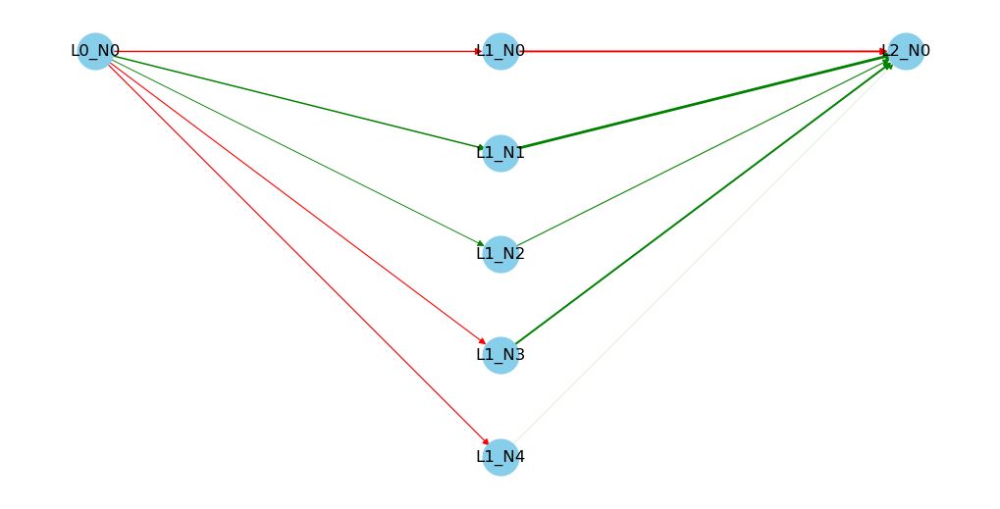

In [ ]:
network_ss_5_15.visualize_network()

test mse: 2.9272991676861557


<Axes: >

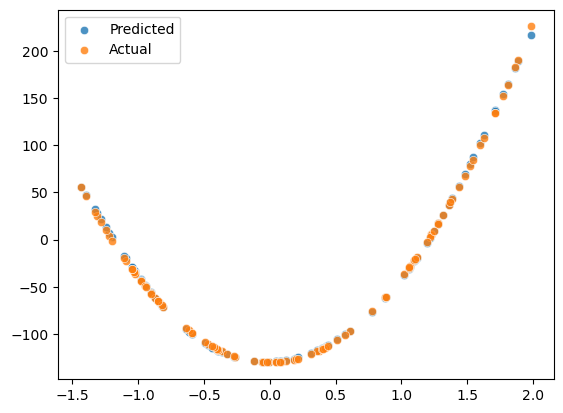

In [ ]:
x = square_simple_test_X.reshape(100,1)
y = square_simple_test_Y.reshape(100,1)
x_std = (x - network_ss_5_15.standardize_params_x[0]) / network_ss_5_15.standardize_params_x[1]

network_ss_5_15.forward(x_std)
y_pred_std = network_ss_5_15.activations[-1]
y_pred = network_ss_5_15.destandardize_data(y_pred_std, 'y')

print('test mse:', np.mean((y - y_pred) ** 2))

sns.scatterplot(x=x.flatten(), y=y_pred.flatten(), alpha=0.8, label='Predicted')
sns.scatterplot(x=x.flatten(), y=y.flatten(), alpha=0.8, label='Actual')

### STEPS SMALL

In [ ]:
network_step_55_5 = network(np.array([1, 5, 5, 1]), [None, sigmoid, sigmoid, linear], [None, sigmoid_derivative, sigmoid_derivative, linear_derivative], 'xavier')
network_step_55_5.learn(steps_small_train, 80000, 0.1, 5)

network_step_55_15 = network(np.array([1, 5, 5, 1]), [None, sigmoid, sigmoid, linear], [None, sigmoid_derivative, sigmoid_derivative, linear_derivative], 'xavier')
network_step_55_15.learn(steps_small_train, 80000, 0.1, 15)

network_step_55_25 = network(np.array([1, 5, 5, 1]), [None, sigmoid, sigmoid, linear], [None, sigmoid_derivative, sigmoid_derivative, linear_derivative], 'xavier')
network_step_55_25.learn(steps_small_train, 80000, 0.1, 25)

network_step_55_35 = network(np.array([1, 5, 5, 1]), [None, sigmoid, sigmoid, linear], [None, sigmoid_derivative, sigmoid_derivative, linear_derivative], 'xavier')
network_step_55_35.learn(steps_small_train, 80000, 0.1, 35)

Final mse batch 5:  2.467504897901744
Final mse batch 15:  56.58288220929099
Final mse batch 25:  360.50072291650037
Final mse batch 35:  359.46641501025675


<Axes: >

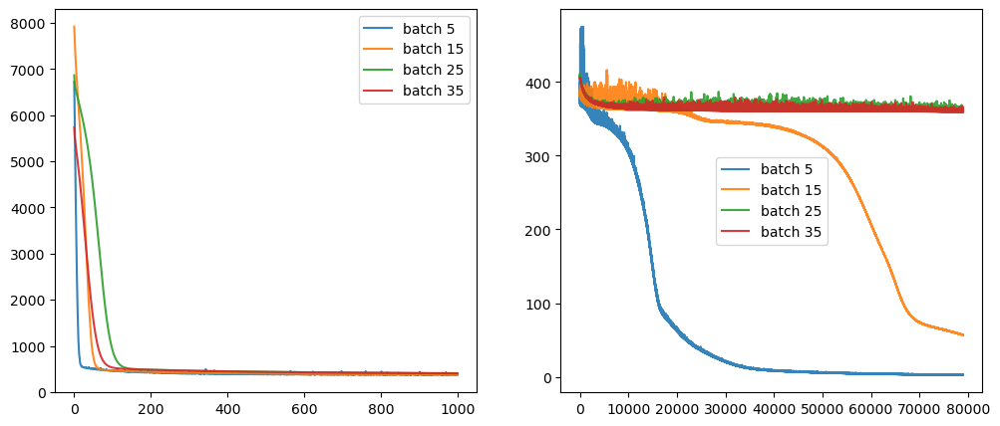

In [ ]:
print('Final mse batch 5: ', network_step_55_5.mse_record[-1])
print('Final mse batch 15: ', network_step_55_15.mse_record[-1])
print('Final mse batch 25: ', network_step_55_25.mse_record[-1])
print('Final mse batch 35: ', network_step_55_35.mse_record[-1])

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
sns.lineplot(network_step_55_5.mse_record[:1000], alpha=0.9, label='batch 5', ax=axes[0])
sns.lineplot(network_step_55_15.mse_record[:1000], alpha=0.9, label='batch 15', ax=axes[0])
sns.lineplot(network_step_55_25.mse_record[:1000], alpha=0.9, label='batch 25', ax=axes[0])
sns.lineplot(network_step_55_35.mse_record[:1000], alpha=0.9, label='batch 35', ax=axes[0])

sns.lineplot(network_step_55_5.mse_record[1000:], alpha=0.9, label='batch 5', ax=axes[1])
sns.lineplot(network_step_55_15.mse_record[1000:], alpha=0.9, label='batch 15', ax=axes[1])
sns.lineplot(network_step_55_25.mse_record[1000:], alpha=0.9, label='batch 25', ax=axes[1])
sns.lineplot(network_step_55_35.mse_record[1000:], alpha=0.9, label='batch 35', ax=axes[1])

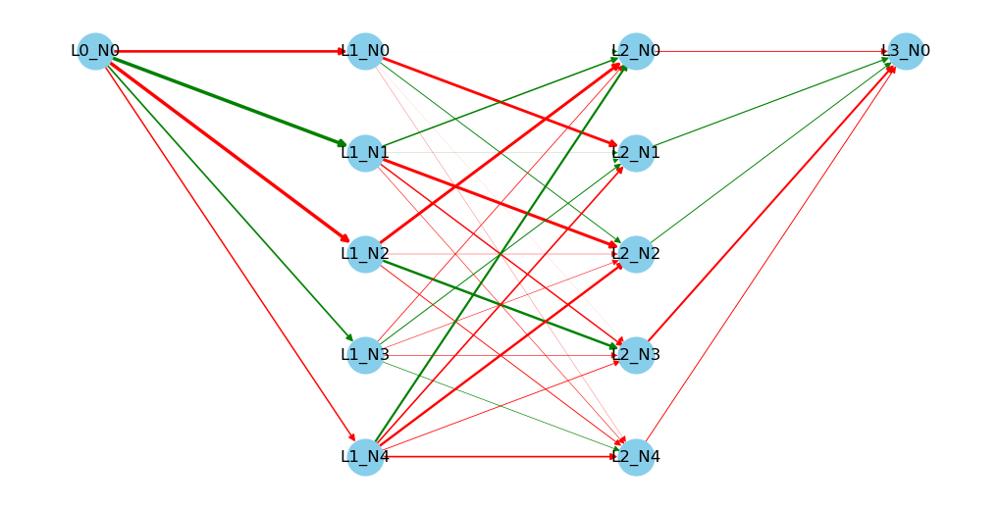

In [ ]:
network_step_55_5.visualize_network()

test mse: 130.6244989452042


<Axes: >

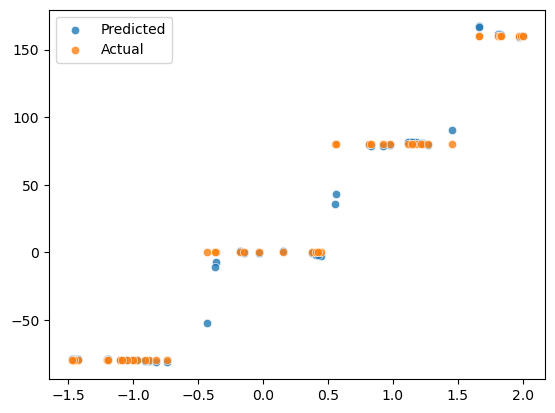

In [ ]:
x = steps_small_test_X.reshape(50,1)
y = steps_small_test_Y.reshape(50,1)
x_std = (x - network_step_55_5.standardize_params_x[0]) / network_step_55_5.standardize_params_x[1]

network_step_55_5.forward(x_std)
y_pred_std = network_step_55_5.activations[-1]
y_pred = network_step_55_5.destandardize_data(y_pred_std, 'y')

print('test mse:', np.mean((y - y_pred) ** 2))

sns.scatterplot(x=x.flatten(), y=y_pred.flatten(), alpha=0.8, label='Predicted')
sns.scatterplot(x=x.flatten(), y=y.flatten(), alpha=0.8, label='Actual')

### MULTIMODAL LARGE

In [ ]:
network_multi_55_500 = network(np.array([1, 5, 5, 1]), [None, sigmoid, sigmoid, linear], [None, sigmoid_derivative, sigmoid_derivative, linear_derivative], 'xavier')
network_multi_55_500.learn(multimodal_large_train, 20000, 0.5, 500)

network_multi_55_250 = network(np.array([1, 5, 5, 1]), [None, sigmoid, sigmoid, linear], [None, sigmoid_derivative, sigmoid_derivative, linear_derivative], 'xavier')
network_multi_55_250.learn(multimodal_large_train, 20000, 0.5, 250)

network_multi_55_250_1 = network(np.array([1, 5, 5, 1]), [None, sigmoid, sigmoid, linear], [None, sigmoid_derivative, sigmoid_derivative, linear_derivative], 'xavier')
network_multi_55_250_1.learn(multimodal_large_train, 20000, 1, 250)

network_multi_1010_500 = network(np.array([1, 10, 10, 1]), [None, sigmoid, sigmoid, linear], [None, sigmoid_derivative, sigmoid_derivative, linear_derivative], 'xavier')
network_multi_1010_500.learn(multimodal_large_train, 20000, 0.5, 500)

network_multi_1010_250 = network(np.array([1, 10, 10, 1]), [None, sigmoid, sigmoid, linear], [None, sigmoid_derivative, sigmoid_derivative, linear_derivative], 'xavier')
network_multi_1010_250.learn(multimodal_large_train, 20000, 0.5, 250)

network_multi_1010_250_1 = network(np.array([1, 10, 10, 1]), [None, sigmoid, sigmoid, linear], [None, sigmoid_derivative, sigmoid_derivative, linear_derivative], 'xavier')
network_multi_1010_250_1.learn(multimodal_large_train, 20000, 1, 250)

Final mse network_multi_55_500:  320.59480776389717
Final mse network_multi_55_250:  17.07300440058157
Final mse network_multi_55_250_1:  296.9951657072367
Final mse network_multi_1010_500:  6.845182366210513
Final mse network_multi_1010_250:  7.106422930888839
Final mse network_multi_1010_250_1:  6.13554067874538


<Axes: >

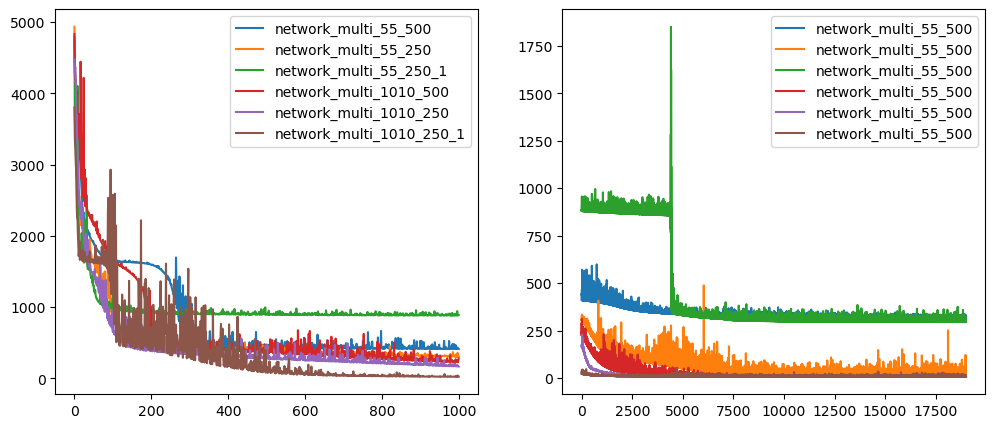

In [ ]:
print('Final mse network_multi_55_500: ', network_multi_55_500.mse_record[-1])
print('Final mse network_multi_55_250: ', network_multi_55_250.mse_record[-1])
print('Final mse network_multi_55_250_1: ', network_multi_55_250_1.mse_record[-1])
print('Final mse network_multi_1010_500: ', network_multi_1010_500.mse_record[-1])
print('Final mse network_multi_1010_250: ', network_multi_1010_250.mse_record[-1])
print('Final mse network_multi_1010_250_1: ', network_multi_1010_250_1.mse_record[-1])

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
sns.lineplot(network_multi_55_500.mse_record[:1000], label='network_multi_55_500', ax=axes[0])
sns.lineplot(network_multi_55_250.mse_record[:1000], label='network_multi_55_250', ax=axes[0])
sns.lineplot(network_multi_55_250_1.mse_record[:1000], label='network_multi_55_250_1', ax=axes[0])
sns.lineplot(network_multi_1010_500.mse_record[:1000], label='network_multi_1010_500', ax=axes[0])
sns.lineplot(network_multi_1010_250.mse_record[:1000], label='network_multi_1010_250', ax=axes[0])
sns.lineplot(network_multi_1010_250_1.mse_record[:1000], label='network_multi_1010_250_1', ax=axes[0])

sns.lineplot(network_multi_55_500.mse_record[1000:], label='network_multi_55_500', ax=axes[1])
sns.lineplot(network_multi_55_250.mse_record[1000:], label='network_multi_55_500', ax=axes[1])
sns.lineplot(network_multi_55_250_1.mse_record[1000:], label='network_multi_55_500', ax=axes[1])
sns.lineplot(network_multi_1010_500.mse_record[1000:], label='network_multi_55_500', ax=axes[1])
sns.lineplot(network_multi_1010_250.mse_record[1000:], label='network_multi_55_500', ax=axes[1])
sns.lineplot(network_multi_1010_250_1.mse_record[1000:], label='network_multi_55_500', ax=axes[1])

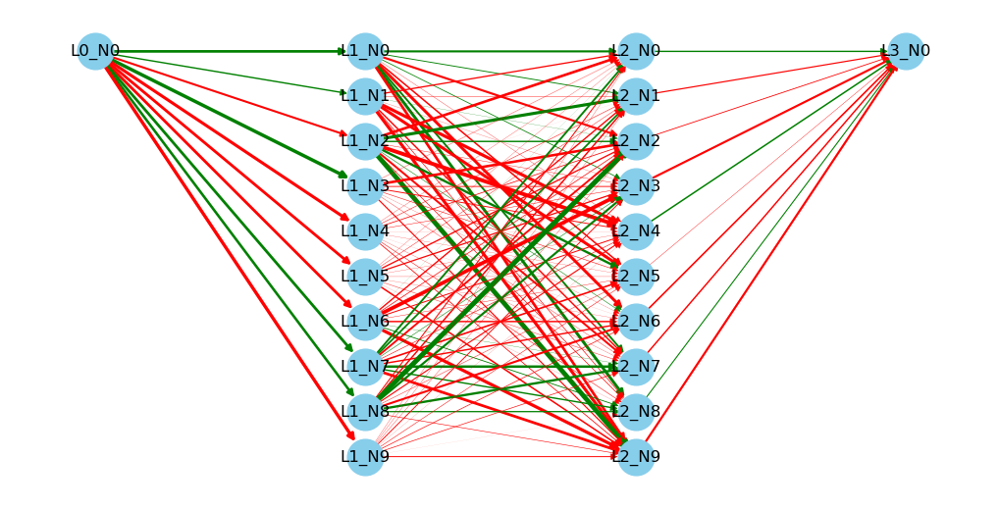

In [ ]:
network_multi_1010_250_1.visualize_network()

test mse: 2.5781319003016296


<Axes: >

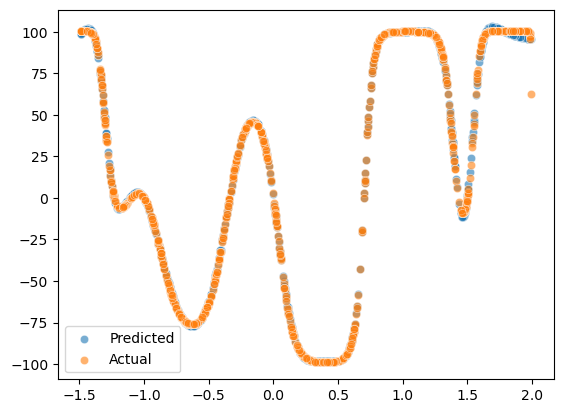

In [ ]:
plot_network = network_multi_1010_500

x = multimodal_large_test_X.reshape(1000 ,1)
y = multimodal_large_test_Y.reshape(1000 ,1)
x_std = (x - plot_network.standardize_params_x[0]) / plot_network.standardize_params_x[1]

plot_network.forward(x_std)
y_pred_std = plot_network.activations[-1]
y_pred = plot_network.destandardize_data(y_pred_std, 'y')

print('test mse:', np.mean((y - y_pred) ** 2))

sns.scatterplot(x=x.flatten(), y=y_pred.flatten(), alpha=0.6, label='Predicted')
sns.scatterplot(x=x.flatten(), y=y.flatten(), alpha=0.6, label='Actual')

### Wnioski
Backpropagacja pozwala na uczenie sieci neuronowych. Całościowo widać, że zmniejszanie wielkość batchy wpływa korzystnie na tempo uczenia, kosztem długości obliczeń.

## 3. Implementacja momentu i normalizacji gradientu
Dodanie uczenia z momentem oraz gradientem RMSProp ma na celu po pierwsze przyspieszyć a po drugie ustabilizować proces uczenia. Metody te wprowadzają dodatkowy element w wyznaczaniu gradientów, który bierze pod uwagę nie tylko obecną propagację błedu ale również zapamiętane z wcześniej kierunki poprzedniej zbieżności. Wykorzystanie tej informacji może przepchnąć sieć przez tymczasowe wypłaszczenie gradientu lub ułatwić "wpadnięcie" w wąskie gardło.  

In [ ]:
# implementacja NN3

def sigmoid(x):
	return 1/(1+np.e**(-x))

def sigmoid_derivative(x):
	return sigmoid(x) * (1 - sigmoid(x))

def linear(x):
	return x

def linear_derivative(x):
	return 1

class network:
	def __init__(self, architecture, activation_functions, activation_derivatives, initiation_method):
		self.architecture = architecture
		self.activation_functions = activation_functions
		self.activation_derivatives = activation_derivatives
		self.weights_biases_initiation(initiation_method)
		self.mse_record = []

	def set_state(self, architecture, biases, weights, activation_functions):
		self.architecture = architecture
		self.biases = biases
		self.weights = weights
		self.activation_functions = activation_functions

	def weights_biases_initiation(self, initiation_method):
		self.weights = [None]
		self.biases = [None]
		self.weights_momentum = [None]
		self.biases_momentum = [None]
		self.weigths_rmsProp = [None]
		self.biases_rmsProp = [None]

		if initiation_method not in ['he', 'xavier', 'uniform']:
			print('Initiation method incorrect!')
			return 

		for i in range(len(self.architecture) - 1):
			input_dim = self.architecture[i]
			output_dim = self.architecture[i + 1]
			
			if initiation_method == 'he':
				weight_matrix = np.random.randn(input_dim, output_dim) * np.sqrt(2 / input_dim)
			elif initiation_method == 'xavier':
				weight_matrix = np.random.randn(input_dim, output_dim) * np.sqrt(1 / input_dim)
			elif initiation_method == 'uniform':
				weight_matrix = np.random.uniform(0, 1, (input_dim, output_dim))

			bias_vector = np.zeros((1, output_dim))
			
			self.weights_momentum.append(np.zeros(weight_matrix.shape))
			self.biases_momentum.append(np.zeros(bias_vector.shape))
			self.weigths_rmsProp.append(np.zeros(weight_matrix.shape))
			self.biases_rmsProp.append(np.zeros(bias_vector.shape))
			self.weights.append(weight_matrix)
			self.biases.append(bias_vector)

	def forward(self, X):
		# as a convention, for convinience, zeroth index of activations is raw input, i add None to preactivations for uniform indexing
		self.activations = [X]
		self.preactivations = [None]

		for i in range(0, len(self.architecture)-1):
			z = np.dot(self.activations[i], self.weights[i+1]) + self.biases[i+1]
			self.preactivations.append(z)
			
			a = self.activation_functions[i+1](z)
			self.activations.append(a)
	
	def check_MSE(self, x, y):
		self.forward(x)
		prediction = self.destandardize_data(self.activations[-1], 'y')
		correct = self.destandardize_data(y, 'y')
		return np.mean((correct - prediction) ** 2)
	
	def visualize_network(self):
		G = nx.DiGraph()
		pos = {}
		edge_colors = []
		edge_widths = []
		
		for layer_idx, num_nodes in enumerate(self.architecture):
			for node_idx in range(num_nodes):
				node_name = f"L{layer_idx}_N{node_idx}"
				pos[node_name] = (layer_idx, -node_idx)  
				G.add_node(node_name)
				
				if layer_idx > 0: 
					for prev_idx in range(self.architecture[layer_idx - 1]):
						prev_name = f"L{layer_idx-1}_N{prev_idx}"
						weight = self.weights[layer_idx][prev_idx][node_idx]

						if weight != 0:
							G.add_edge(prev_name, node_name)
							edge_colors.append('red' if weight < 0 else 'green')
							edge_widths.append(np.log(abs(weight)))
		
		plt.figure(figsize=(10, 5))
		nx.draw(G, pos, with_labels=True, node_size=700, node_color="skyblue", edge_color=edge_colors, width=edge_widths)
		plt.show()

	def backward(self, Y):
		self.error = [None] * (len(self.weights))
		self.weights_gradient = [None] * (len(self.weights))
		self.biases_gradient = [None] * (len(self.weights))

		self.error[-1] = (self.activations[-1] - Y) * self.activation_derivatives[-1](self.preactivations[-1])
		for i in reversed(range(1, len(self.error) - 1)):
			self.error[i] = np.dot(self.error[i+1], self.weights[i+1].T) * self.activation_derivatives[i](self.preactivations[i])
		
		for i in range(1, len(self.error)):
			# self.weights_gradient[i] = -step * np.dot(self.activations[i-1].T, self.error[i]) / self.error[i].shape[0]
			# self.biases_gradient[i] = (-step * np.mean(self.error[i], axis=0)).reshape(1, -1)
			self.weights_gradient[i] = np.dot(self.activations[i-1].T, self.error[i]) / self.error[i].shape[0]
			self.biases_gradient[i] = (np.mean(self.error[i], axis=0)).reshape(1, -1)

	def prepeare_batches(self, data, batch_size=None):
		n = len(data)
		if batch_size == None:
			batch_number = 1
		else:
			batch_number = int(np.ceil(n / batch_size))

		data_shuffled = np.random.permutation(data)
		x = data_shuffled[:,0].reshape(n,1)
		y = data_shuffled[:,1].reshape(n,1)

		x = self.standardize_data(x, 'x')
		y = self.standardize_data(y, 'y')
		
		x = np.array_split(x, batch_number)
		y = np.array_split(y, batch_number)

		return x, y, batch_number
	
	def learn_old(self, x, y, step, iterations):
		x = self.standardize_data(x, 'x')
		y = self.standardize_data(y, 'y')

		for e in range(iterations):
			self.forward(x)
			self.backward(y, step)
			
			for i in range(1, len(self.architecture)):
					self.weights[i] += self.weights_gradient[i]
					self.biases[i] += self.biases_gradient[i]

			self.mse_record.append(self.check_MSE(x, y))

	def learn(self, data, epochs_number, step, momentum_dumping=None, rmsprop_dumping=None, batch_size=None):
		if momentum_dumping != None and rmsprop_dumping != None:
			print('Both momentum and rmsProp parameters were passed. Choose one.')
			return 
		
		for e in range(epochs_number):
			x, y, batch_number = self.prepeare_batches(data, batch_size)

			for b in range(batch_number):
				self.forward(x[b])
				self.backward(y[b])

				for i in range(1, len(self.architecture)):
					if momentum_dumping == None and rmsprop_dumping == None:
						# simple learning
						self.weights[i] -= self.weights_gradient[i] * step
						self.biases[i] -= self.biases_gradient[i] * step

					elif momentum_dumping != None and rmsprop_dumping == None:
						# learning with momentum
						self.weights_momentum[i] = self.weights_momentum[i] * momentum_dumping - self.weights_gradient[i]
						self.biases_momentum[i] = self.biases_momentum[i] * momentum_dumping - self.biases_gradient[i]
						self.weights[i] += self.weights_momentum[i] * step
						self.biases[i] += self.biases_momentum[i] * step

					elif momentum_dumping == None and rmsprop_dumping != None:
						# learning with rmsProp
						epsilon = 1e-8
						self.weigths_rmsProp[i] = rmsprop_dumping * self.weigths_rmsProp[i] + (1 - rmsprop_dumping) * self.weights_gradient[i]**2
						self.biases_rmsProp[i] = rmsprop_dumping * self.biases_rmsProp[i] + (1 - rmsprop_dumping) * self.biases_gradient[i]**2
						self.weights[i] -= step/(np.sqrt(self.weigths_rmsProp[i] + epsilon)) * self.weights_gradient[i]
						self.biases[i] -= step/(np.sqrt(self.biases_rmsProp[i] + epsilon)) * self.biases_gradient[i]

			self.mse_record.append(self.check_MSE(np.vstack(x), np.vstack(y)))

	def standardize_data(self, data, type):
		mean = np.mean(data, axis=0)
		std = np.std(data, axis=0)
		data_new = (data - mean) / std

		if type == 'x':
			self.standardize_params_x = (mean, std)
		if type == 'y':
			self.standardize_params_y = (mean, std)

		return data_new

	def destandardize_data(self, data, type):
		if type == 'x':
			return data * self.standardize_params_x[1] + self.standardize_params_x[0]
		if type == 'y':
			return data * self.standardize_params_y[1] + self.standardize_params_y[0]

def test(x, y, size, network):
	x = x.reshape(size, 1)
	y = y.reshape(size, 1)
	x_std = (x - network.standardize_params_x[0]) / network.standardize_params_x[1]
	
	network.forward(x_std)
	y_pred_std = network.activations[-1]
	y_pred = network.destandardize_data(y_pred_std, 'y')

	print('test mse:', np.mean((y - y_pred) ** 2))
	sns.scatterplot(x=x.flatten(), y=y_pred.flatten(), alpha=0.8, label='Predicted')
	sns.scatterplot(x=x.flatten(), y=y.flatten(), alpha=0.8, label='Actual')

### SQUARE LARGE

In [ ]:
network_151_square_rms = network(np.array([1, 5, 1]), [None, sigmoid, linear], [None, sigmoid_derivative, linear_derivative], 'xavier')
network_151_square_mom = network(np.array([1, 5, 1]), [None, sigmoid, linear], [None, sigmoid_derivative, linear_derivative], 'xavier')

network_151_square_rms.learn(square_large_train, 1500, 0.015, rmsprop_dumping=0.95, batch_size=15)
network_151_square_mom.learn(square_large_train, 1500, 0.025, momentum_dumping=0.8, batch_size=15)

Final mse RMSprop:  0.9742467303347344
Final mse momentum:  0.4119774631221969


<Axes: >

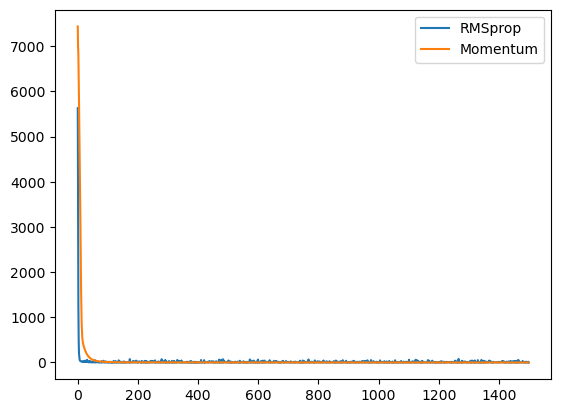

In [ ]:
print('Final mse RMSprop: ', network_151_square_rms.mse_record[-1])
print('Final mse momentum: ', network_151_square_mom.mse_record[-1])
sns.lineplot(network_151_square_rms.mse_record, label = 'RMSprop')
sns.lineplot(network_151_square_mom.mse_record, label = 'Momentum')

test mse: 185.7985869042097


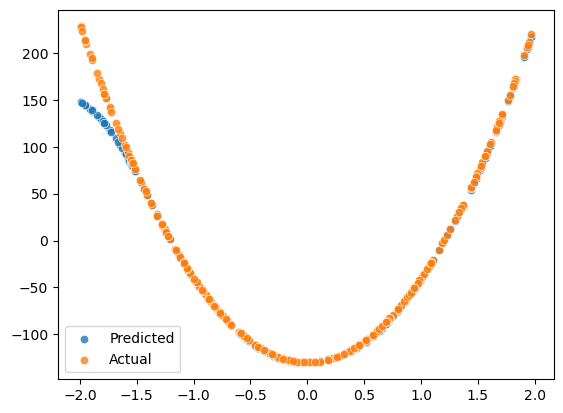

In [ ]:
# SQUARE RMSPROP
size = square_large_test.shape[0]
test(square_large_test_X, square_large_test_Y, size, network_151_square_rms)

test mse: 79.76575537270463


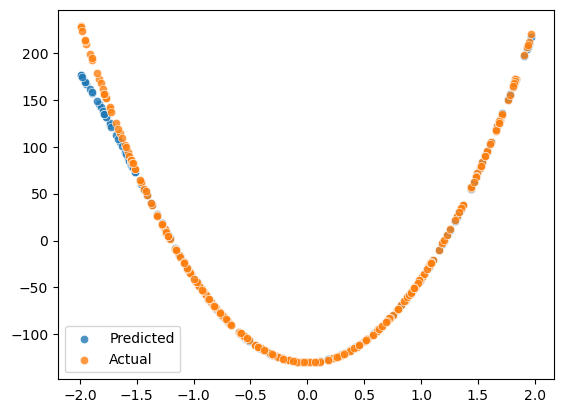

In [ ]:
# SQUARE MOMENTUM
size = square_large_test.shape[0]
test(square_large_test_X, square_large_test_Y, size, network_151_square_mom)

### STEPS LARGE

Final mse steps_rms:  7.1819093018267335


<Axes: >

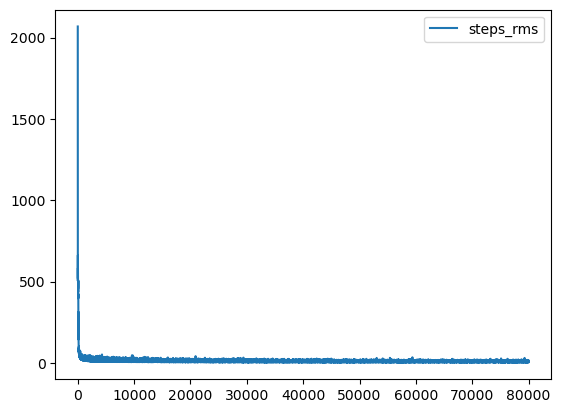

In [ ]:
# size: 10000
#18
steps_rms = network(np.array([1, 5, 5, 1]), [None, sigmoid, sigmoid, linear], [None, sigmoid_derivative, sigmoid_derivative,linear_derivative], 'xavier')

steps_rms.learn(steps_large_train, 80000, 0.025, rmsprop_dumping=0.9, batch_size=500)

print('Final mse steps_rms: ', steps_rms.mse_record[-1])

sns.lineplot(steps_rms.mse_record, label = 'steps_rms')

Final mse steps_mom:  2.9531577730409686


<Axes: >

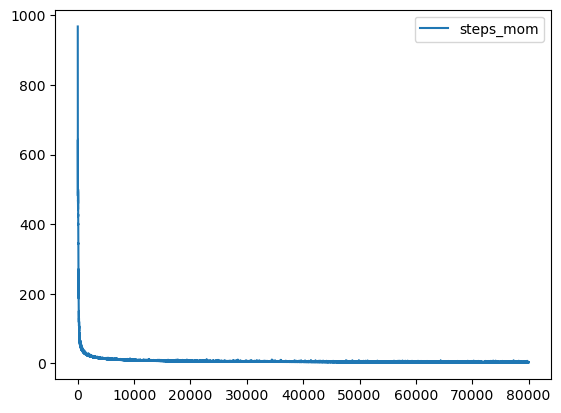

In [ ]:
# 10
steps_mom = network(np.array([1, 5, 5, 1]), [None, sigmoid, sigmoid, linear], [None, sigmoid_derivative, sigmoid_derivative,linear_derivative], 'xavier')

steps_mom.learn(steps_large_train, 80000, 0.8, momentum_dumping=0.9, batch_size=500)

print('Final mse steps_mom: ', steps_mom.mse_record[-1])

sns.lineplot(steps_mom.mse_record, label = 'steps_mom')

test mse: 3.30272042965379


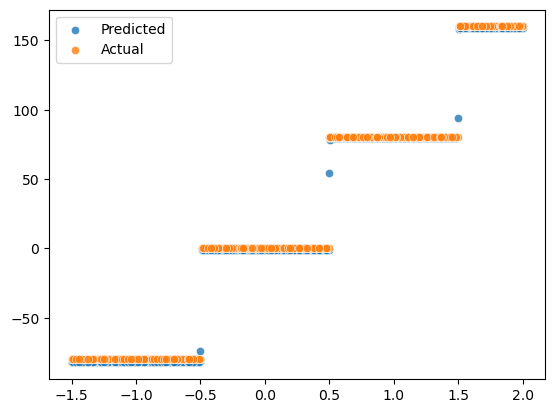

In [ ]:
# STEPS RMSPROP
size = steps_large_test.shape[0]
test(steps_large_test_X, steps_large_test_Y, size, steps_rms)

test mse: 2.966282147403025


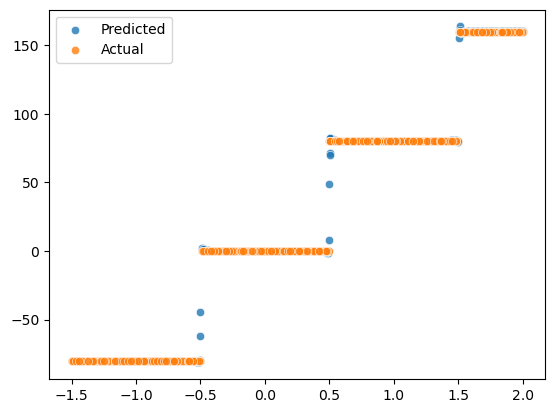

In [ ]:
# STEPS MOMENTUM
size = steps_large_test.shape[0]
test(steps_large_test_X, steps_large_test_Y, size, steps_mom)

### MULTIMODAL LARGE

Final mse network_multimodal_rms:  28.224690410330076


<Axes: >

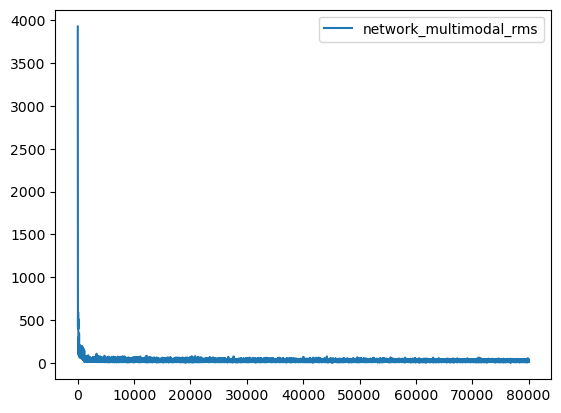

In [ ]:
# size: 10000
# 29
network_multimodal_rms = network(np.array([1, 10, 10, 1]), [None, sigmoid, sigmoid, linear], [None, sigmoid_derivative, sigmoid_derivative, linear_derivative], 'xavier')
network_multimodal_rms.learn(multimodal_large_train, 80000, 0.025, rmsprop_dumping=0.9, batch_size=500)

print('Final mse network_multimodal_rms: ', network_multimodal_rms.mse_record[-1])
sns.lineplot(network_multimodal_rms.mse_record, label = 'network_multimodal_rms')

Final mse network_multimodal_mom:  6.407829178801352


<Axes: >

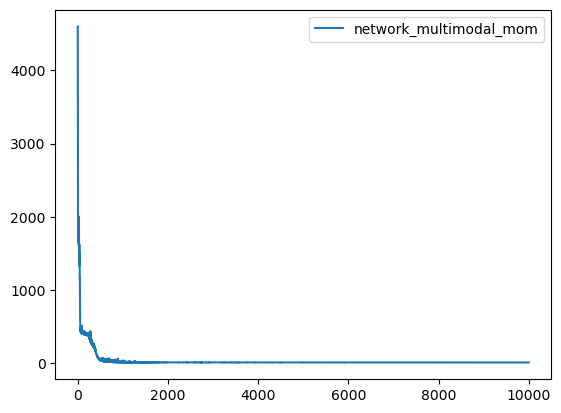

In [ ]:
network_multimodal_mom = network(np.array([1, 10, 10, 1]), [None, sigmoid, sigmoid, linear], [None, sigmoid_derivative, sigmoid_derivative, linear_derivative], 'xavier')
network_multimodal_mom.learn(multimodal_large_train, 10000, 0.6, momentum_dumping=0.9, batch_size=1000)

print('Final mse network_multimodal_mom: ', network_multimodal_mom.mse_record[-1])
sns.lineplot(network_multimodal_mom.mse_record, label = 'network_multimodal_mom')

test mse: 28.753050305020444


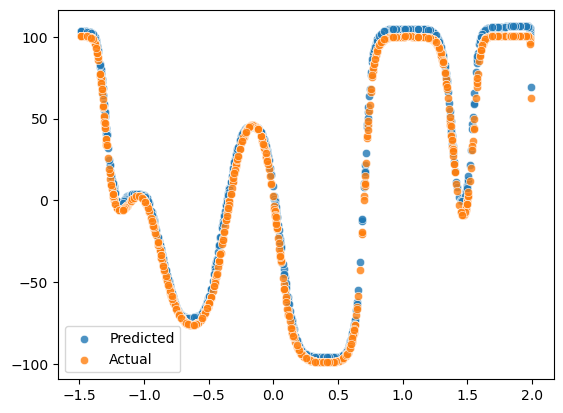

In [ ]:
# MULTIMODAL RMSPROP
size = multimodal_large_test.shape[0]
test(multimodal_large_test_X, multimodal_large_test_Y, 1000, network_multimodal_rms)

test mse: 1.973036229724195


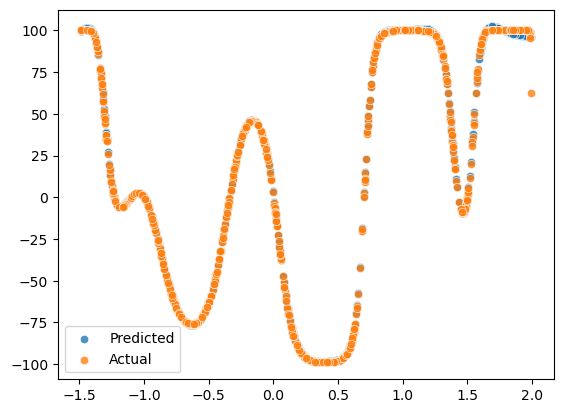

In [ ]:
# MULTIMODAL MOMENTUM
size = multimodal_large_test.shape[0]
test(multimodal_large_test_X, multimodal_large_test_Y, 1000, network_multimodal_mom)

### Wnioski
Świetne narzędzie. Zarówno moment jak i RMSprop znacząco przyspiesza spadek w gradiencie. Proces uczenia jest stabilny i szybki, a metoda ta nie jest wrażliwa na manipulacje parametrami co zachowuje prostote używania.

## 4. Rozwiązywanie zadania klasyfikacji
Zadania klasyfikacji są na pierwszy rzut oka zupełnie innym problemem niż regresja. Jednak jak się okazuje działanie sieci jest bardzo podobne. W tym zadaniu musiałem wykonać dużo zmian w implementacji jednak większość z nich była sprzątaniem wcześniejszych leniwych linijek kodu. Oba zadania są implementowane w jednej funkcji uczenia i wybór klasyfikacji wykonuje również funkcję zamieniającą wektor odpowiedzi w macierz kodowania one-hot. Efekty uczenia w tym przypadku są śledzone zarówno przez cross-entropy które jest naszą funkcją straty, jak również przez f-score.

In [ ]:
# implementacja NN4

def sigmoid(x):
	return 1/(1+np.e**(-x))

def sigmoid_derivative(x):
	return sigmoid(x) * (1 - sigmoid(x))

def linear(x):
	return x

def linear_derivative(x):
	return 1

def softmax(x):
    if x.ndim == 1:
        x = x.reshape(1, -1)  
    
    e_x = np.exp(x - np.max(x, axis=1, keepdims=True))
    return e_x / np.sum(e_x, axis=1, keepdims=True)

class network:
	def __init__(self, architecture, activation_functions, activation_derivatives, initiation_method):
		self.architecture = architecture
		self.activation_functions = activation_functions
		self.activation_derivatives = activation_derivatives
		self.weights_biases_initiation(initiation_method)
		self.loss_record = []
		self.f1_score = []

	def set_state(self, architecture, biases, weights, activation_functions):
		self.architecture = architecture
		self.biases = biases
		self.weights = weights
		self.activation_functions = activation_functions

	def weights_biases_initiation(self, initiation_method):
		self.weights = [None]
		self.biases = [None]
		self.weights_momentum = [None]
		self.biases_momentum = [None]
		self.weigths_rmsProp = [None]
		self.biases_rmsProp = [None]

		if initiation_method not in ['he', 'xavier', 'uniform']:
			print('Initiation method incorrect!')
			return 

		for i in range(len(self.architecture) - 1):
			input_dim = self.architecture[i]
			output_dim = self.architecture[i + 1]
			
			if initiation_method == 'he':
				weight_matrix = np.random.randn(input_dim, output_dim) * np.sqrt(2 / input_dim)
			elif initiation_method == 'xavier':
				weight_matrix = np.random.randn(input_dim, output_dim) * np.sqrt(1 / input_dim)
			elif initiation_method == 'uniform':
				weight_matrix = np.random.uniform(0, 1, (input_dim, output_dim))

			bias_vector = np.zeros((1, output_dim))
			
			self.weights_momentum.append(np.zeros(weight_matrix.shape))
			self.biases_momentum.append(np.zeros(bias_vector.shape))
			self.weigths_rmsProp.append(np.zeros(weight_matrix.shape))
			self.biases_rmsProp.append(np.zeros(bias_vector.shape))
			self.weights.append(weight_matrix)
			self.biases.append(bias_vector)

	def forward(self, X):
		# as a convention, for convinience, zeroth index of activations is raw input, i add None to preactivations for uniform indexing
		self.activations = [X]
		self.preactivations = [None]

		for i in range(0, len(self.architecture)-1):
			z = np.dot(self.activations[i], self.weights[i+1]) + self.biases[i+1]
			self.preactivations.append(z)
			
			a = self.activation_functions[i+1](z)
			self.activations.append(a)
	
	def check_MSE(self, x, y):
		self.forward(x)
		prediction = self.destandardize_data(self.activations[-1], 'y')
		correct = self.destandardize_data(y, 'y')
		return np.mean((correct - prediction) ** 2)
	
	def check_categorical_crossentropy_loss(self, x, y, epsilon=1e-12):
		self.forward(x)
		prediction = self.activations[-1]
		prediction = np.clip(prediction, epsilon, 1.0 - epsilon)
		loss = -np.sum(y * np.log(prediction), axis=1)
		return np.mean(loss)

	def check_fmeasure(self, x, y):
		self.forward(x)
		prediction = np.argmax(self.activations[-1], axis=1)
		correct = np.argmax(y, axis=1)

		labels = np.unique(y)

		true_positives = np.zeros(len(labels))
		false_positives = np.zeros(len(labels))
		false_negatives = np.zeros(len(labels))

		for i, label in enumerate(labels):
			true_positives[i] = np.sum((prediction == label) & (correct == label))
			false_positives[i] = np.sum((prediction == label) & (correct != label))
			false_negatives[i] = np.sum((prediction != label) & (correct == label))

		precision = true_positives / (true_positives+false_positives + 1e-10)
		recall = true_positives / (true_positives+false_negatives + 1e-10)

		f1_per_class = 2 * (precision * recall) / (precision + recall + 1e-10)
		return np.mean(f1_per_class)
	
	def visualize_network(self):
		G = nx.DiGraph()
		pos = {}
		edge_colors = []
		edge_widths = []
		
		for layer_idx, num_nodes in enumerate(self.architecture):
			for node_idx in range(num_nodes):
				node_name = f"L{layer_idx}_N{node_idx}"
				pos[node_name] = (layer_idx, -node_idx)  
				G.add_node(node_name)
				
				if layer_idx > 0: 
					for prev_idx in range(self.architecture[layer_idx - 1]):
						prev_name = f"L{layer_idx-1}_N{prev_idx}"
						weight = self.weights[layer_idx][prev_idx][node_idx]

						if weight != 0:
							G.add_edge(prev_name, node_name)
							edge_colors.append('red' if weight < 0 else 'green')
							edge_widths.append(np.log(abs(weight)))
		
		plt.figure(figsize=(10, 5))
		nx.draw(G, pos, with_labels=True, node_size=700, node_color="skyblue", edge_color=edge_colors, width=edge_widths)
		plt.show()

	def backward(self, Y, task):
		self.error = [None] * (len(self.weights))
		self.weights_gradient = [None] * (len(self.weights))
		self.biases_gradient = [None] * (len(self.weights))

		# if task == 'regression':
		# 	self.error[-1] = (self.activations[-1] - Y) * self.activation_derivatives[-1](self.preactivations[-1])
		# if task == 'classification':
		# 	self.error[-1] = (self.activations[-1] - Y)
		
		# normalnie to to kwestia czy regresja czy klasyfikacja ale żeby spróbować klasyfikacji dla liniowej ostatniej warstywy robie tak 
		if self.activation_functions[-1] != softmax: 
			self.error[-1] = (self.activations[-1] - Y) * self.activation_derivatives[-1](self.preactivations[-1])
		else:
			self.error[-1] = (self.activations[-1] - Y)

		for i in reversed(range(1, len(self.error) - 1)):
			self.error[i] = np.dot(self.error[i+1], self.weights[i+1].T) * self.activation_derivatives[i](self.preactivations[i])
		
		for i in range(1, len(self.error)):
			# self.weights_gradient[i] = -step * np.dot(self.activations[i-1].T, self.error[i]) / self.error[i].shape[0]
			# self.biases_gradient[i] = (-step * np.mean(self.error[i], axis=0)).reshape(1, -1)
			self.weights_gradient[i] = np.dot(self.activations[i-1].T, self.error[i]) / self.error[i].shape[0]
			self.biases_gradient[i] = (np.mean(self.error[i], axis=0)).reshape(1, -1)

	def prepeare_batches(self, x, y, task, batch_size=None):
			n = len(x)
			if batch_size == None:
				batch_number = 1
			else:
				batch_number = int(np.ceil(n / batch_size))

			indices = np.random.permutation(n)
			x_shuffled = x[indices]
			y_shuffled = y[indices]

			x_batched = np.array_split(x_shuffled, batch_number)
			y_batched = np.array_split(y_shuffled, batch_number)

			return x_batched, y_batched, batch_number
		
	def prepare_data(self, x, y, task):
		input_size = len(x)
		
		for i in range(input_size):
			size = len(x[i])
			x[i] = np.reshape(x[i], (size, 1))
		
		x = np.hstack(x)
		y = np.reshape(y, (len(y), 1))

		x_standardized = self.standardize_data(x, 'x')

		if task == 'classification':
			labels = np.unique(y)
			label_to_index = {label: index for index, label in enumerate(labels)}
			indexes = np.array([label_to_index[label] for label in y.flatten()])

			labels_num = len(labels)
			y = np.eye(labels_num)[indexes]

			return x_standardized, y
		else:
			y_standardized = self.standardize_data(y, 'y')

			return x_standardized, y_standardized
	
	def learn_old(self, x, y, step, iterations):
		x = self.standardize_data(x, 'x')
		y = self.standardize_data(y, 'y')

		for e in range(iterations):
			self.forward(x)
			self.backward(y, step)
			
			for i in range(1, len(self.architecture)):
					self.weights[i] += self.weights_gradient[i]
					self.biases[i] += self.biases_gradient[i]

			self.mse_record.append(self.check_MSE(x, y))

	def learn(self, task, x, y, epochs_number, step, momentum_dumping=None, rmsprop_dumping=None, batch_size=None):
		if momentum_dumping != None and rmsprop_dumping != None:
			print('Both momentum and rmsProp parameters were passed! Choose one.')
			return 
		
		if task not in ['classification', 'regression']:
			print('Incorrect network task! Choose classification or regression.')
			return
		
		x, y = self.prepare_data(x, y, task)
		
		for e in range(epochs_number):
			x_batches, y_batches, batch_number = self.prepeare_batches(x, y, task, batch_size)

			for b in range(batch_number):
				self.forward(x_batches[b])
				self.backward(y_batches[b], task)

				for i in range(1, len(self.architecture)):
					if momentum_dumping == None and rmsprop_dumping == None:
						# simple learning
						self.weights[i] -= self.weights_gradient[i] * step
						self.biases[i] -= self.biases_gradient[i] * step

					elif momentum_dumping != None and rmsprop_dumping == None:
						# learning with momentum
						self.weights_momentum[i] = self.weights_momentum[i] * momentum_dumping - self.weights_gradient[i]
						self.biases_momentum[i] = self.biases_momentum[i] * momentum_dumping - self.biases_gradient[i]
						self.weights[i] += self.weights_momentum[i] * step
						self.biases[i] += self.biases_momentum[i] * step

					elif momentum_dumping == None and rmsprop_dumping != None:
						# learning with rmsProp
						epsilon = 1e-8
						self.weigths_rmsProp[i] = rmsprop_dumping * self.weigths_rmsProp[i] + (1 - rmsprop_dumping) * self.weights_gradient[i]**2
						self.biases_rmsProp[i] = rmsprop_dumping * self.biases_rmsProp[i] + (1 - rmsprop_dumping) * self.biases_gradient[i]**2
						self.weights[i] -= step/(np.sqrt(self.weigths_rmsProp[i] + epsilon)) * self.weights_gradient[i]
						self.biases[i] -= step/(np.sqrt(self.biases_rmsProp[i] + epsilon)) * self.biases_gradient[i]

			if task == 'regression':
				self.loss_record.append(self.check_MSE(np.vstack(x_batches), np.vstack(y_batches)))
			if task == 'classification':
				self.loss_record.append(self.check_categorical_crossentropy_loss(np.vstack(x_batches), np.vstack(y_batches)))
				self.f1_score.append(self.check_fmeasure(np.vstack(x_batches), np.vstack(y_batches)))

	def standardize_data(self, data, type):
		mean = np.mean(data, axis=0)
		std = np.std(data, axis=0)
		data_new = (data - mean) / std

		if type == 'x':
			self.standardize_params_x = (mean, std)
		if type == 'y':
			self.standardize_params_y = (mean, std)

		return data_new

	def destandardize_data(self, data, type):
		if type == 'x':
			return data * self.standardize_params_x[1] + self.standardize_params_x[0]
		if type == 'y':
			return data * self.standardize_params_y[1] + self.standardize_params_y[0]

def test_regression(x, y, size, network):
	x = x.reshape(size, 1)
	y = y.reshape(size, 1)
	x_std = (x - network.standardize_params_x[0]) / network.standardize_params_x[1]
	
	network.forward(x_std)
	y_pred_std = network.activations[-1]
	y_pred = network.destandardize_data(y_pred_std, 'y')

	print('test mse:', np.mean((y - y_pred) ** 2))
	sns.scatterplot(x=x.flatten(), y=y_pred.flatten(), alpha=0.8, label='Predicted')
	sns.scatterplot(x=x.flatten(), y=y.flatten(), alpha=0.8, label='Actual')

def test_classification(x, y, network):
	task = 'classification'

	x_prep, y_prep = network.prepare_data(x, y, task)

	print('test cross entropy:', network.check_categorical_crossentropy_loss(x_prep, y_prep))
	print('test f-measure:', network.check_fmeasure(x_prep, y_prep))
	classification = np.argmax(network.activations[-1], axis=1)

	fig, axes = plt.subplots(1, 2, figsize=(12, 5))
	sns.scatterplot(x=x[0].flatten(), y=x[1].flatten(), hue=classification, ax=axes[0], palette='Set1')
	axes[0].set_title("Predicted Classification")
	sns.scatterplot(x=x[0].flatten(), y=x[1].flatten(), hue=y.flatten(), ax=axes[1], palette='Set1')
	axes[1].set_title("True Classification")

### RINGS3 (SOFTMAX)

Final f1_score:  0.980473459381179
Final loss score:  0.07279187089384906
test cross entropy: 0.17653469241199676
test f-measure: 0.9202076124066241


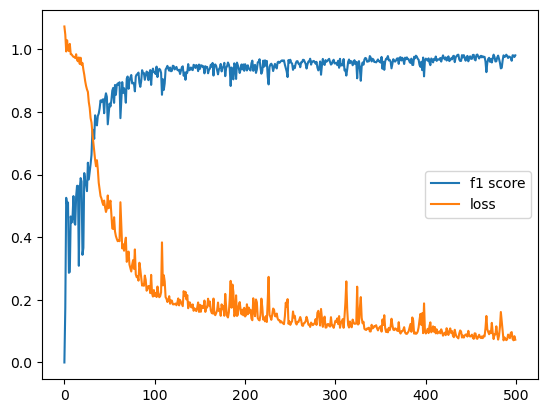

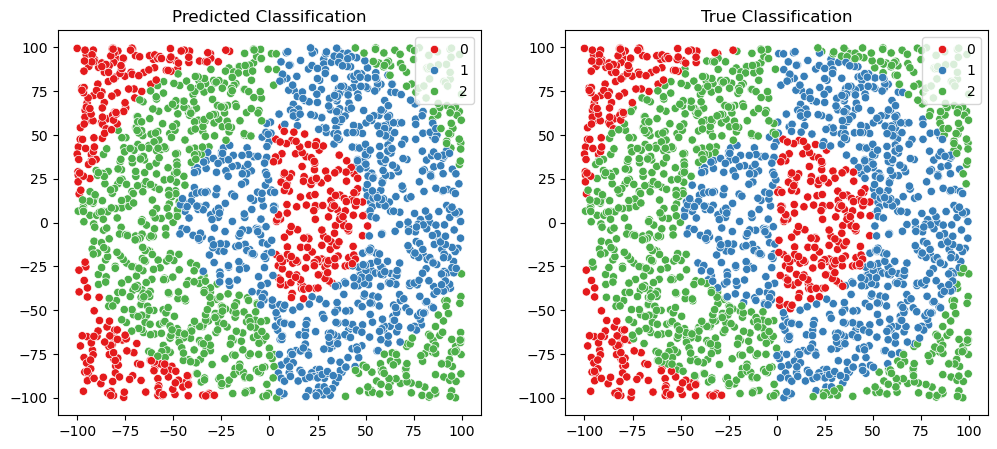

In [ ]:
network_rings = network(architecture = np.array([2, 64, 64, 3]), 
                        activation_functions = [None, sigmoid, sigmoid, softmax], 
                        activation_derivatives = [None, sigmoid_derivative, sigmoid_derivative, None], 
                        initiation_method = 'xavier')

network_rings.learn(task = 'classification',
                     x = [rings_train_X, rings_train_Y],
                     y = rings_train_C,
                     epochs_number = 500,
                     step = 0.1,
                     momentum_dumping = 0.9,
                     batch_size = 150)

print('Final f1_score: ', network_rings.f1_score[-1])
print('Final loss score: ', network_rings.loss_record[-1])
sns.lineplot(network_rings.f1_score, label = 'f1 score')
sns.lineplot(network_rings.loss_record, label = 'loss')

test_classification([rings_test_X, rings_test_Y], rings_test_C, network_rings)

### RINGS3 (LINEAR)

Final f1_score:  0.9634237902530159
Final loss score:  0.20584958186530491
test cross entropy: 0.22817936226045343
test f-measure: 0.9166874040778323


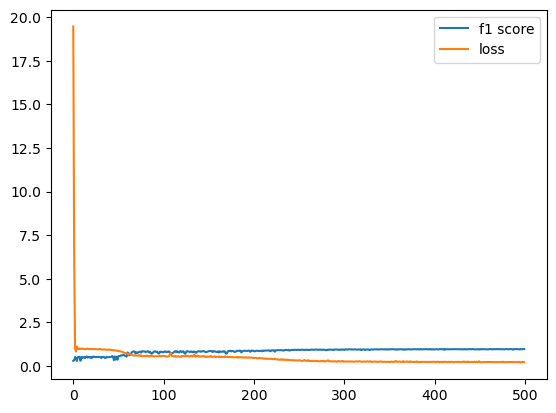

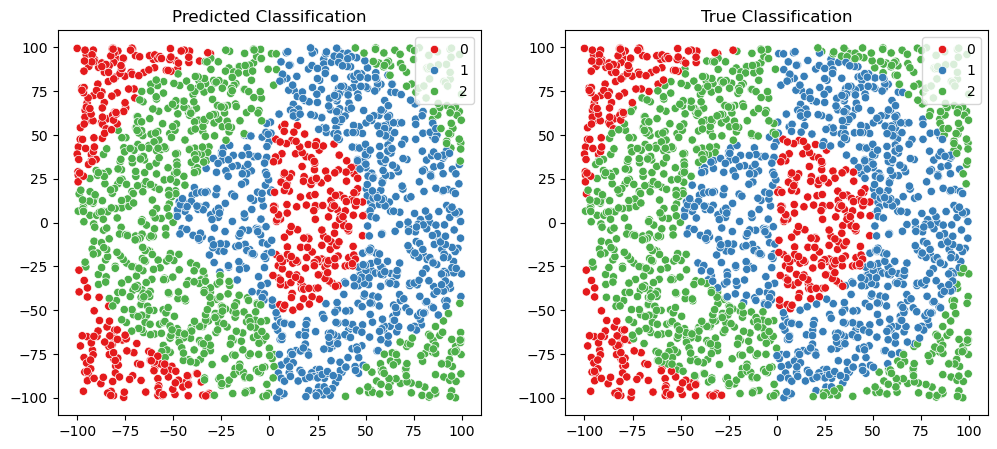

In [ ]:
network_rings = network(architecture = np.array([2, 64, 64, 3]), 
                        activation_functions = [None, sigmoid, sigmoid, linear], 
                        activation_derivatives = [None, sigmoid_derivative, sigmoid_derivative, linear_derivative], 
                        initiation_method = 'xavier')

network_rings.learn(task = 'classification',
                     x = [rings_train_X, rings_train_Y],
                     y = rings_train_C,
                     epochs_number = 500,
                     step = 0.1,
                     momentum_dumping = 0.9,
                     batch_size = 150)

print('Final f1_score: ', network_rings.f1_score[-1])
print('Final loss score: ', network_rings.loss_record[-1])
sns.lineplot(network_rings.f1_score, label = 'f1 score')
sns.lineplot(network_rings.loss_record, label = 'loss')

test_classification([rings_test_X, rings_test_Y], rings_test_C, network_rings)

### EASY (SOFTMAX)

Final f1_score:  0.9839999999496064
Final loss score:  0.17821801410103322
test cross entropy: 0.17208861568764924
test f-measure: 0.9839907786381437


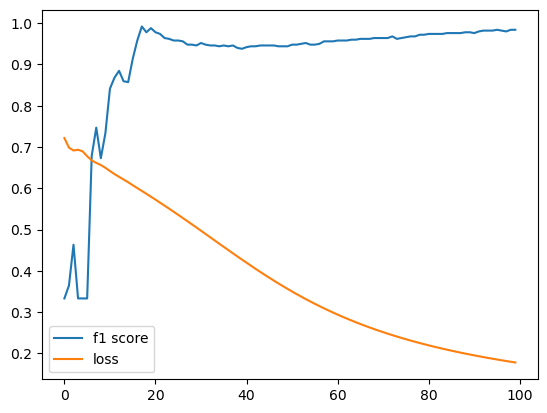

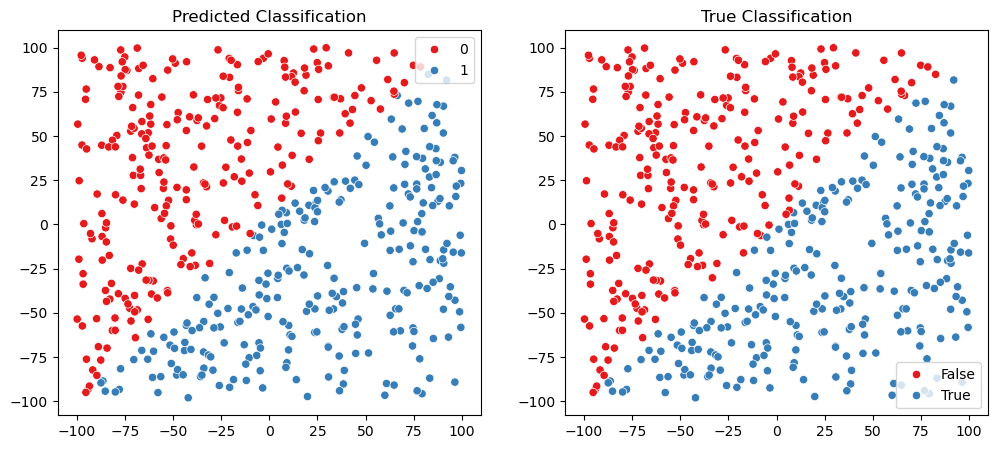

In [ ]:
network_simple = network(architecture = np.array([2, 32, 32, 2]), 
                        activation_functions = [None, sigmoid, sigmoid, softmax], 
                        activation_derivatives = [None, sigmoid_derivative, sigmoid_derivative, None], 
                        initiation_method = 'xavier')

network_simple.learn(task = 'classification',
                     x = [easy_train_X, easy_train_Y],
                     y = easy_train_C,
                     epochs_number = 100,
                     step = 0.01,
                     momentum_dumping = 0.90,
                     batch_size = 200)

print('Final f1_score: ', network_simple.f1_score[-1])
print('Final loss score: ', network_simple.loss_record[-1])
sns.lineplot(network_simple.f1_score, label = 'f1 score')
sns.lineplot(network_simple.loss_record, label = 'loss')

test_classification([easy_test_X, easy_test_Y], easy_test_C, network_simple)

### EASY (LINEAR)

Final f1_score:  0.96599877590555
Final loss score:  0.2605184170074234
test cross entropy: 0.2525994161443775
test f-measure: 0.9639717538046566


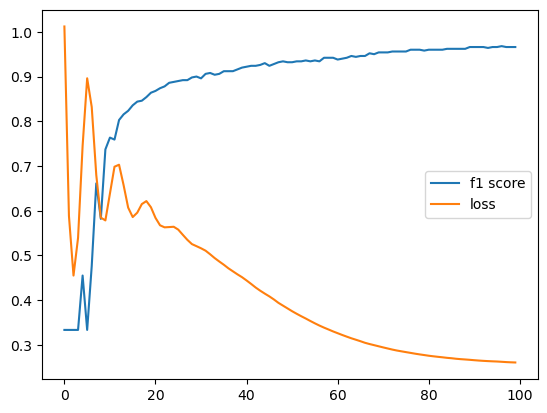

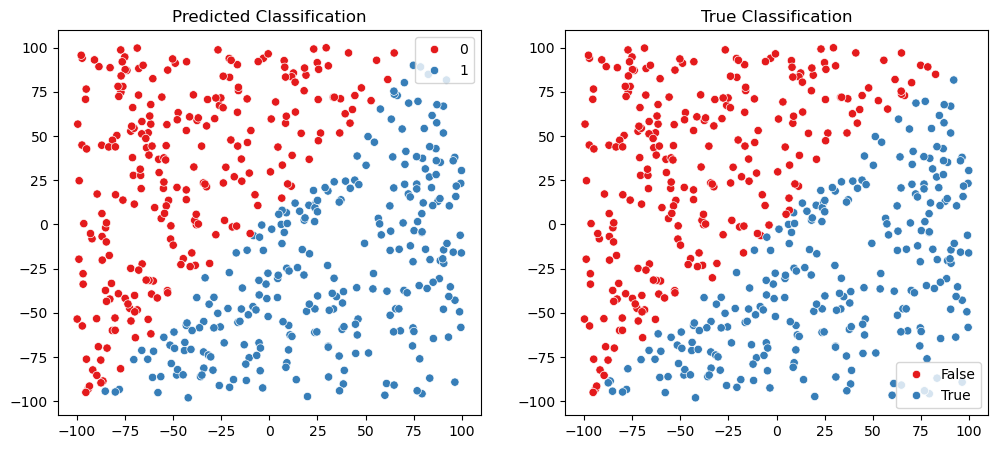

In [ ]:
network_simple = network(architecture = np.array([2, 32, 32, 2]), 
                        activation_functions = [None, sigmoid, sigmoid, linear], 
                        activation_derivatives = [None, sigmoid_derivative, sigmoid_derivative, linear_derivative], 
                        initiation_method = 'xavier')

network_simple.learn(task = 'classification',
                     x = [easy_train_X, easy_train_Y],
                     y = easy_train_C,
                     epochs_number = 100,
                     step = 0.01,
                     momentum_dumping = 0.90,
                     batch_size = 200)

print('Final f1_score: ', network_simple.f1_score[-1])
print('Final loss score: ', network_simple.loss_record[-1])
sns.lineplot(network_simple.f1_score, label = 'f1 score')
sns.lineplot(network_simple.loss_record, label = 'loss')

test_classification([easy_test_X, easy_test_Y], easy_test_C, network_simple)

### XOR3 (SOFTMAX)

Final f1_score:  0.980473459381179
Final loss score:  0.07279187089384906
test cross entropy: 0.17653469241199676
test f-measure: 0.9202076124066241


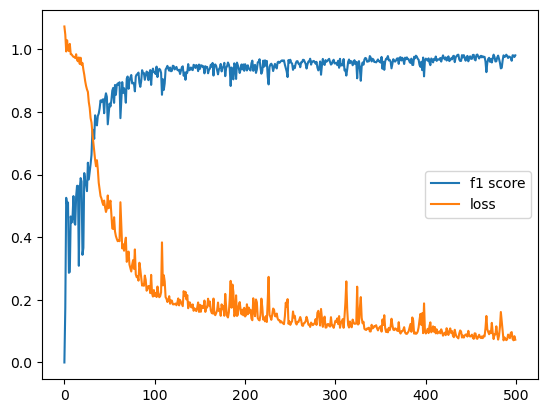

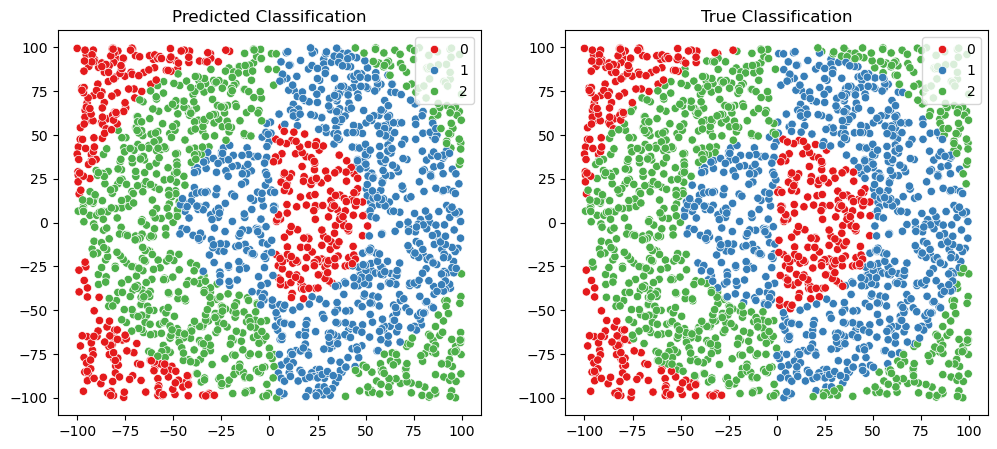

In [ ]:
network_rings = network(architecture = np.array([2, 64, 64, 3]), 
                        activation_functions = [None, sigmoid, sigmoid, softmax], 
                        activation_derivatives = [None, sigmoid_derivative, sigmoid_derivative, None], 
                        initiation_method = 'xavier')

network_rings.learn(task = 'classification',
                     x = [rings_train_X, rings_train_Y],
                     y = rings_train_C,
                     epochs_number = 500,
                     step = 0.1,
                     momentum_dumping = 0.9,
                     batch_size = 150)

print('Final f1_score: ', network_rings.f1_score[-1])
print('Final loss score: ', network_rings.loss_record[-1])
sns.lineplot(network_rings.f1_score, label = 'f1 score')
sns.lineplot(network_rings.loss_record, label = 'loss')

test_classification([rings_test_X, rings_test_Y], rings_test_C, network_rings)

### XOR3 (LINEAR)

Final f1_score:  0.9599942391200638
Final loss score:  0.18915965890649056
test cross entropy: 0.2732821004497216
test f-measure: 0.8784755978499158


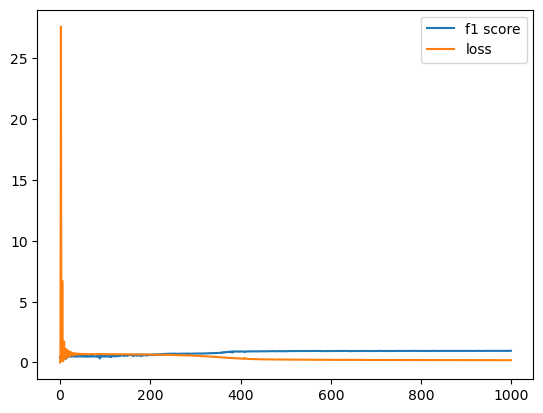

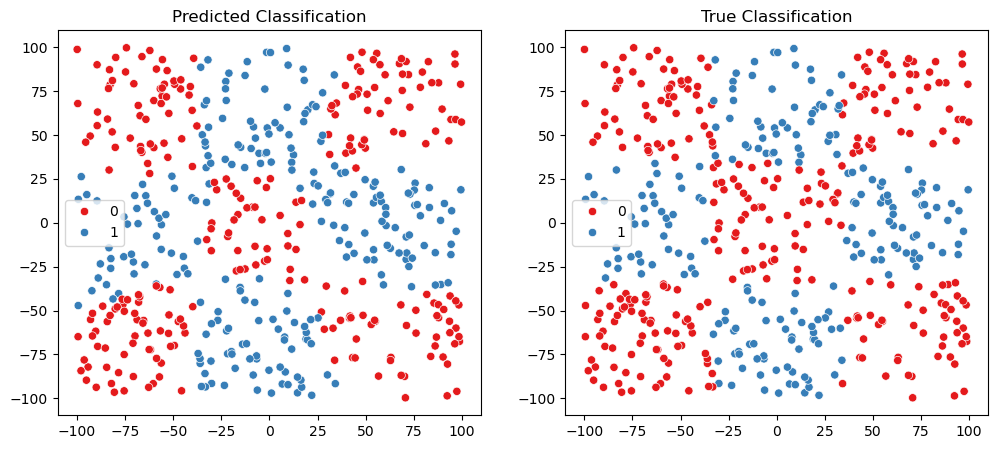

In [ ]:
network_xor3 = network(architecture = np.array([2, 30, 30, 2]), 
                        activation_functions = [None, sigmoid, sigmoid, linear], 
                        activation_derivatives = [None, sigmoid_derivative, sigmoid_derivative, linear_derivative], 
                        initiation_method = 'xavier')

network_xor3.learn(task = 'classification',
                     x = [xor3_train_X, xor3_train_Y],
                     y = xor3_train_C,
                     epochs_number = 1000,
                     step = 0.05,
                     momentum_dumping = 0.95,
                     batch_size = 200)

print('Final f1_score: ', network_xor3.f1_score[-1])
print('Final loss score: ', network_xor3.loss_record[-1])
sns.lineplot(network_xor3.f1_score, label = 'f1 score')
sns.lineplot(network_xor3.loss_record, label = 'loss')

test_classification([xor3_test_X, xor3_test_Y], xor3_test_C, network_xor3)

### Wnioski
##### zbiór rings
Bardzo ciekawy zbiorek, ale wcale nie trudniejszy dużo, epok wciąż mało a 0.75 f-score na testowym bez najmniejszych problemów.

##### zbiór easy
Faktycznie jest easy, na treningowym bardzo szybko można osiągnąć 0.999... f-score ale żeby wstrzelić się w wynik ponad 0.99 na testowym to trochę ruletka, 0.985.. udało mi się najwięcej.

##### zbiór xor3
Zdecydowanie najgorszy case, najlepszy f-score na teście jaki widziałem to okolice 0.91, ciężko szukać przy ilu epokach jeszcze się nie przetrenowuje, bo wyniki (przy jednakowych parametrach) są chyba najbardziej zmienne ze wszystkich zbiorów.

Poniżej próba tego samego ale z liniową aktywacją na końcu sieci no i radzi sobie świetnie, przy tych samych parametrach, być może te zadania klasyfikacji nie są jeszcze aż tak wygórowane. W tych wydrukach gdzie jest napisane cross entropy powinno być oczywiście mse.

## 5. Testowanie różnych funkcji aktywacji
W tym zadaniu zaimplementowałem dodatwkowe funkcje aktywacji.

Mamy do przeprowadzenia porównanie architektór 1, 2 i 3 warstwowych (ukryte warstwy) dla aktywacji liniowych, sigmoidalnych, tanh oraz ReLU. Przyjmuję ograniczenie, że liczba neuronów w warstwach jest taka sama i ograniczam się do ilości; małej np. 5, średniej np. 15 i dużej np. 30. Wtedy mamy $3 * 4 * 3 = 36$ testów. Hiperparametry będą stałe, a początkowe wagi wygenerowane z rozkładu xavier. Sieci będą nazwane w konwencji: (lin/sig/tan/rel)\_(w3/w2/w1)\_(small/medium/big).

Pozwalam sobie na wybranie 3, a nie dwóch najlepszych modeli z racji, że moje testy pokazały, że każdy z najlepszej trójki korzystał z innej funkcji aktywacji i próba wyciśnięcia z nich jak najwięcej może być ciekawa. Będą to: rel_w3_medium, tan_w3_big oraz sig_w3_big.

In [ ]:
# implementacja NN5

def sigmoid(x):
	return 1/(1+np.e**(-x))

def sigmoid_derivative(x):
	return sigmoid(x) * (1 - sigmoid(x))

def linear(x):
	return x

def linear_derivative(x):
	return 1

def softmax(x):
    if x.ndim == 1:
        x = x.reshape(1, -1)  
    
    e_x = np.exp(x - np.max(x, axis=1, keepdims=True))
    return e_x / np.sum(e_x, axis=1, keepdims=True)

def tanh(x):
	return (np.exp(x) - np.exp(-x)) / (np.exp(x) + np.exp(-x))

def tanh_derivative(x):
	return 1 - tanh(x)**2

def ReLU(x):
	return np.maximum(0, x)

def ReLU_derivative(x):
	return np.where(x > 0, 1, 0)

class network:
	def __init__(self, architecture, activation_functions, activation_derivatives, initiation_method):
		self.architecture = architecture
		self.activation_functions = activation_functions
		self.activation_derivatives = activation_derivatives
		self.weights_biases_initiation(initiation_method)
		self.loss_record = []
		self.f1_score = []

	def set_state(self, architecture, biases, weights, activation_functions):
		self.architecture = architecture
		self.biases = biases
		self.weights = weights
		self.activation_functions = activation_functions

	def weights_biases_initiation(self, initiation_method):
		self.weights = [None]
		self.biases = [None]
		self.weights_momentum = [None]
		self.biases_momentum = [None]
		self.weigths_rmsProp = [None]
		self.biases_rmsProp = [None]

		if initiation_method not in ['he', 'xavier', 'uniform']:
			print('Initiation method incorrect!')
			return 

		for i in range(len(self.architecture) - 1):
			input_dim = self.architecture[i]
			output_dim = self.architecture[i + 1]
			
			if initiation_method == 'he':
				weight_matrix = np.random.randn(input_dim, output_dim) * np.sqrt(2 / input_dim)
			elif initiation_method == 'xavier':
				weight_matrix = np.random.randn(input_dim, output_dim) * np.sqrt(1 / input_dim)
			elif initiation_method == 'uniform':
				weight_matrix = np.random.uniform(0, 1, (input_dim, output_dim))

			bias_vector = np.zeros((1, output_dim))
			
			self.weights_momentum.append(np.zeros(weight_matrix.shape))
			self.biases_momentum.append(np.zeros(bias_vector.shape))
			self.weigths_rmsProp.append(np.zeros(weight_matrix.shape))
			self.biases_rmsProp.append(np.zeros(bias_vector.shape))
			self.weights.append(weight_matrix)
			self.biases.append(bias_vector)

	def forward(self, X):
		# as a convention, for convinience, zeroth index of activations is raw input, i add None to preactivations for uniform indexing
		self.activations = [X]
		self.preactivations = [None]

		for i in range(0, len(self.architecture)-1):
			z = np.dot(self.activations[i], self.weights[i+1]) + self.biases[i+1]
			self.preactivations.append(z)
			
			a = self.activation_functions[i+1](z)
			self.activations.append(a)
	
	def check_MSE(self, x, y):
		self.forward(x)
		prediction = self.destandardize_data(self.activations[-1], 'y')
		correct = self.destandardize_data(y, 'y')
		return np.mean((correct - prediction) ** 2)
	
	def check_categorical_crossentropy_loss(self, x, y, epsilon=1e-12):
		self.forward(x)
		prediction = self.activations[-1]
		prediction = np.clip(prediction, epsilon, 1.0 - epsilon)
		loss = -np.sum(y * np.log(prediction), axis=1)
		return np.mean(loss)

	def check_fmeasure(self, x, y):
		self.forward(x)
		prediction = np.argmax(self.activations[-1], axis=1)
		correct = np.argmax(y, axis=1)

		labels = np.unique(y)

		true_positives = np.zeros(len(labels))
		false_positives = np.zeros(len(labels))
		false_negatives = np.zeros(len(labels))

		for i, label in enumerate(labels):
			true_positives[i] = np.sum((prediction == label) & (correct == label))
			false_positives[i] = np.sum((prediction == label) & (correct != label))
			false_negatives[i] = np.sum((prediction != label) & (correct == label))

		precision = true_positives / (true_positives+false_positives + 1e-10)
		recall = true_positives / (true_positives+false_negatives + 1e-10)

		f1_per_class = 2 * (precision * recall) / (precision + recall + 1e-10)
		return np.mean(f1_per_class)
	
	def visualize_network(self):
		G = nx.DiGraph()
		pos = {}
		edge_colors = []
		edge_widths = []
		
		for layer_idx, num_nodes in enumerate(self.architecture):
			for node_idx in range(num_nodes):
				node_name = f"L{layer_idx}_N{node_idx}"
				pos[node_name] = (layer_idx, -node_idx)  
				G.add_node(node_name)
				
				if layer_idx > 0: 
					for prev_idx in range(self.architecture[layer_idx - 1]):
						prev_name = f"L{layer_idx-1}_N{prev_idx}"
						weight = self.weights[layer_idx][prev_idx][node_idx]

						if weight != 0:
							G.add_edge(prev_name, node_name)
							edge_colors.append('red' if weight < 0 else 'green')
							edge_widths.append(np.log(abs(weight)))
		
		plt.figure(figsize=(10, 5))
		nx.draw(G, pos, with_labels=True, node_size=700, node_color="skyblue", edge_color=edge_colors, width=edge_widths)
		plt.show()

	def backward(self, Y, task):
		self.error = [None] * (len(self.weights))
		self.weights_gradient = [None] * (len(self.weights))
		self.biases_gradient = [None] * (len(self.weights))

		# if task == 'regression':
		# 	self.error[-1] = (self.activations[-1] - Y) * self.activation_derivatives[-1](self.preactivations[-1])
		# if task == 'classification':
		# 	self.error[-1] = (self.activations[-1] - Y)
		
		# normalnie to to kwestia czy regresja czy klasyfikacja ale żeby spróbować klasyfikacji dla liniowej ostatniej warstywy robie tak 
		if self.activation_functions[-1] != softmax: 
			self.error[-1] = (self.activations[-1] - Y) * self.activation_derivatives[-1](self.preactivations[-1])
		else:
			self.error[-1] = (self.activations[-1] - Y)

		for i in reversed(range(1, len(self.error) - 1)):
			self.error[i] = np.dot(self.error[i+1], self.weights[i+1].T) * self.activation_derivatives[i](self.preactivations[i])
		
		for i in range(1, len(self.error)):
			# self.weights_gradient[i] = -step * np.dot(self.activations[i-1].T, self.error[i]) / self.error[i].shape[0]
			# self.biases_gradient[i] = (-step * np.mean(self.error[i], axis=0)).reshape(1, -1)
			self.weights_gradient[i] = np.dot(self.activations[i-1].T, self.error[i]) / self.error[i].shape[0]
			self.biases_gradient[i] = (np.mean(self.error[i], axis=0)).reshape(1, -1)

	def prepeare_batches(self, x, y, task, batch_size=None):
			n = len(x)
			if batch_size == None:
				batch_number = 1
			else:
				batch_number = int(np.ceil(n / batch_size))

			indices = np.random.permutation(n)
			x_shuffled = x[indices]
			y_shuffled = y[indices]

			x_batched = np.array_split(x_shuffled, batch_number)
			y_batched = np.array_split(y_shuffled, batch_number)

			return x_batched, y_batched, batch_number
		
	def prepare_data(self, x, y, task):
		if type(x) == list:
			input_size = len(x)
			for i in range(input_size):
				size = len(x[i])
				x[i] = np.reshape(x[i], (size, 1))
			x = np.hstack(x)
		else:
			x = np.reshape(x, (len(x), 1))
		
		y = np.reshape(y, (len(y), 1))

		x_standardized = self.standardize_data(x, 'x')

		if task == 'classification':
			labels = np.unique(y)
			label_to_index = {label: index for index, label in enumerate(labels)}
			indexes = np.array([label_to_index[label] for label in y.flatten()])

			labels_num = len(labels)
			y = np.eye(labels_num)[indexes]

			return x_standardized, y
		else:
			y_standardized = self.standardize_data(y, 'y')

			return x_standardized, y_standardized
	
	def learn_old(self, x, y, step, iterations):
		x = self.standardize_data(x, 'x')
		y = self.standardize_data(y, 'y')

		for e in range(iterations):
			self.forward(x)
			self.backward(y, step)
			
			for i in range(1, len(self.architecture)):
					self.weights[i] += self.weights_gradient[i]
					self.biases[i] += self.biases_gradient[i]

			self.mse_record.append(self.check_MSE(x, y))

	def learn(self, task, x, y, epochs_number, step, momentum_dumping=None, rmsprop_dumping=None, batch_size=None):
		if momentum_dumping != None and rmsprop_dumping != None:
			print('Both momentum and rmsProp parameters were passed! Choose one.')
			return 
		
		if task not in ['classification', 'regression']:
			print('Incorrect network task! Choose classification or regression.')
			return
		
		x, y = self.prepare_data(x, y, task)
		
		for e in range(epochs_number):
			x_batches, y_batches, batch_number = self.prepeare_batches(x, y, task, batch_size)

			for b in range(batch_number):
				self.forward(x_batches[b])
				self.backward(y_batches[b], task)

				for i in range(1, len(self.architecture)):
					if momentum_dumping == None and rmsprop_dumping == None:
						# simple learning
						self.weights[i] -= self.weights_gradient[i] * step
						self.biases[i] -= self.biases_gradient[i] * step

					elif momentum_dumping != None and rmsprop_dumping == None:
						# learning with momentum
						self.weights_momentum[i] = self.weights_momentum[i] * momentum_dumping - self.weights_gradient[i]
						self.biases_momentum[i] = self.biases_momentum[i] * momentum_dumping - self.biases_gradient[i]
						self.weights[i] += self.weights_momentum[i] * step
						self.biases[i] += self.biases_momentum[i] * step

					elif momentum_dumping == None and rmsprop_dumping != None:
						# learning with rmsProp
						epsilon = 1e-8
						self.weigths_rmsProp[i] = rmsprop_dumping * self.weigths_rmsProp[i] + (1 - rmsprop_dumping) * self.weights_gradient[i]**2
						self.biases_rmsProp[i] = rmsprop_dumping * self.biases_rmsProp[i] + (1 - rmsprop_dumping) * self.biases_gradient[i]**2
						self.weights[i] -= step/(np.sqrt(self.weigths_rmsProp[i] + epsilon)) * self.weights_gradient[i]
						self.biases[i] -= step/(np.sqrt(self.biases_rmsProp[i] + epsilon)) * self.biases_gradient[i]

			if task == 'regression':
				self.loss_record.append(self.check_MSE(np.vstack(x_batches), np.vstack(y_batches)))
			if task == 'classification':
				self.loss_record.append(self.check_categorical_crossentropy_loss(np.vstack(x_batches), np.vstack(y_batches)))
				self.f1_score.append(self.check_fmeasure(np.vstack(x_batches), np.vstack(y_batches)))

	def standardize_data(self, data, type):
		mean = np.mean(data, axis=0)
		std = np.std(data, axis=0)
		data_new = (data - mean) / std

		if type == 'x':
			self.standardize_params_x = (mean, std)
		if type == 'y':
			self.standardize_params_y = (mean, std)

		return data_new

	def destandardize_data(self, data, type):
		if type == 'x':
			return data * self.standardize_params_x[1] + self.standardize_params_x[0]
		if type == 'y':
			return data * self.standardize_params_y[1] + self.standardize_params_y[0]

def test_regression(x, y, size, network):
	x = x.reshape(size, 1)
	y = y.reshape(size, 1)
	x_std = (x - network.standardize_params_x[0]) / network.standardize_params_x[1]
	
	network.forward(x_std)
	y_pred_std = network.activations[-1]
	y_pred = network.destandardize_data(y_pred_std, 'y')

	print('test mse:', np.mean((y - y_pred) ** 2))
	plt.figure()
	sns.scatterplot(x=x.flatten(), y=y_pred.flatten(), alpha=0.8, label='Predicted')
	sns.scatterplot(x=x.flatten(), y=y.flatten(), alpha=0.8, label='Actual')

def test_classification(x, y, network):
	task = 'classification'

	x_prep, y_prep = network.prepare_data(x, y, task)

	print('test cross entropy:', network.check_categorical_crossentropy_loss(x_prep, y_prep))
	print('test f-measure:', network.check_fmeasure(x_prep, y_prep))
	classification = np.argmax(network.activations[-1], axis=1)

	fig, axes = plt.subplots(1, 2, figsize=(12, 5))
	sns.scatterplot(x=x[0].flatten(), y=x[1].flatten(), hue=classification, ax=axes[0], palette='Set1')
	axes[0].set_title("Predicted Classification")
	sns.scatterplot(x=x[0].flatten(), y=x[1].flatten(), hue=y.flatten(), ax=axes[1], palette='Set1')
	axes[1].set_title("True Classification")

### LINIOWA

Final mse lin_w1_small:  4398.236936284047
Final mse lin_w2_small:  4398.5387536437065
Final mse lin_w3_small:  4398.402293909544
Final mse lin_w1_medium:  4398.307515883017
Final mse lin_w2_medium:  4398.266110266443
Final mse lin_w3_medium:  4398.225243337701
Final mse lin_w1_big:  4398.361410063619
Final mse lin_w2_big:  4398.476766677353
Final mse lin_w3_big:  4398.244558924354


<Axes: >

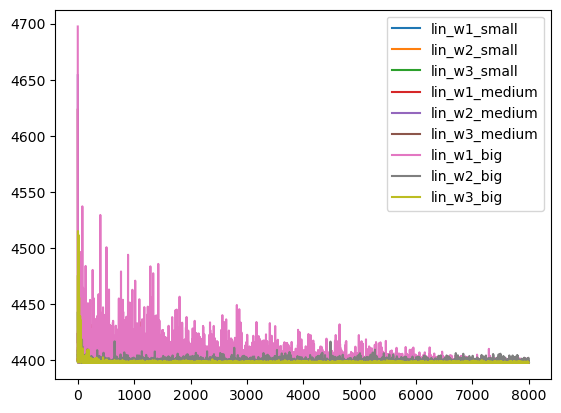

In [ ]:
print('Final mse lin_w1_small: ', lin_w1_small.loss_record[-1])
print('Final mse lin_w2_small: ', lin_w2_small.loss_record[-1])
print('Final mse lin_w3_small: ', lin_w3_small.loss_record[-1])
print('Final mse lin_w1_medium: ', lin_w1_medium.loss_record[-1])
print('Final mse lin_w2_medium: ', lin_w2_medium.loss_record[-1])
print('Final mse lin_w3_medium: ', lin_w3_medium.loss_record[-1])
print('Final mse lin_w1_big: ', lin_w1_big.loss_record[-1])
print('Final mse lin_w2_big: ', lin_w2_big.loss_record[-1])
print('Final mse lin_w3_big: ', lin_w3_big.loss_record[-1])
sns.lineplot(lin_w1_small.loss_record, label = 'lin_w1_small')
sns.lineplot(lin_w2_small.loss_record, label = 'lin_w2_small')
sns.lineplot(lin_w3_small.loss_record, label = 'lin_w3_small')
sns.lineplot(lin_w1_medium.loss_record, label = 'lin_w1_medium')
sns.lineplot(lin_w2_medium.loss_record, label = 'lin_w2_medium')
sns.lineplot(lin_w3_medium.loss_record, label = 'lin_w3_medium')
sns.lineplot(lin_w1_big.loss_record, label = 'lin_w1_big')
sns.lineplot(lin_w2_big.loss_record, label = 'lin_w2_big')
sns.lineplot(lin_w3_big.loss_record, label = 'lin_w3_big')

test mse: 4433.837759304952


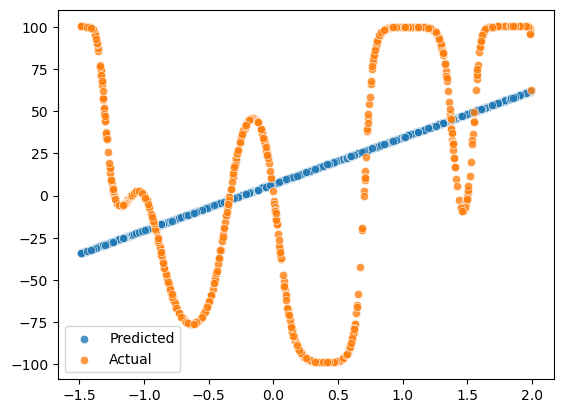

In [ ]:
test_regression(multimodal_large_test_X, multimodal_large_test_Y, 1000, lin_w3_big)

### SIGMOID

Final mse sig_w1_small:  453.7388752371162
Final mse sig_w2_small:  351.23546389666257
Final mse sig_w3_small:  222.75620021284792
Final mse sig_w1_medium:  263.40877647223573
Final mse sig_w2_medium:  195.91945928016858
Final mse sig_w3_medium:  204.47422250984548
Final mse sig_w1_big:  263.12231191878715
Final mse sig_w2_big:  84.33737351495296
Final mse sig_w3_big:  81.70491160124233


<Axes: >

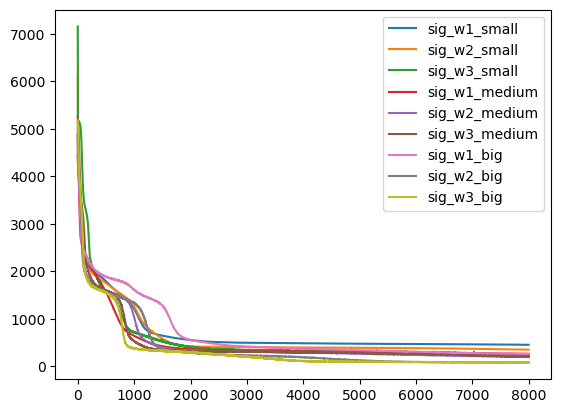

In [ ]:
print('Final mse sig_w1_small: ', sig_w1_small.loss_record[-1])
print('Final mse sig_w2_small: ', sig_w2_small.loss_record[-1])
print('Final mse sig_w3_small: ', sig_w3_small.loss_record[-1])
print('Final mse sig_w1_medium: ', sig_w1_medium.loss_record[-1])
print('Final mse sig_w2_medium: ', sig_w2_medium.loss_record[-1])
print('Final mse sig_w3_medium: ', sig_w3_medium.loss_record[-1])
print('Final mse sig_w1_big: ', sig_w1_big.loss_record[-1])
print('Final mse sig_w2_big: ', sig_w2_big.loss_record[-1])
print('Final mse sig_w3_big: ', sig_w3_big.loss_record[-1])
sns.lineplot(sig_w1_small.loss_record, label = 'sig_w1_small')
sns.lineplot(sig_w2_small.loss_record, label = 'sig_w2_small')
sns.lineplot(sig_w3_small.loss_record, label = 'sig_w3_small')
sns.lineplot(sig_w1_medium.loss_record, label = 'sig_w1_medium')
sns.lineplot(sig_w2_medium.loss_record, label = 'sig_w2_medium')
sns.lineplot(sig_w3_medium.loss_record, label = 'sig_w3_medium')
sns.lineplot(sig_w1_big.loss_record, label = 'sig_w1_big')
sns.lineplot(sig_w2_big.loss_record, label = 'sig_w2_big')
sns.lineplot(sig_w3_big.loss_record, label = 'sig_w3_big')

test mse: 74.43808123534103


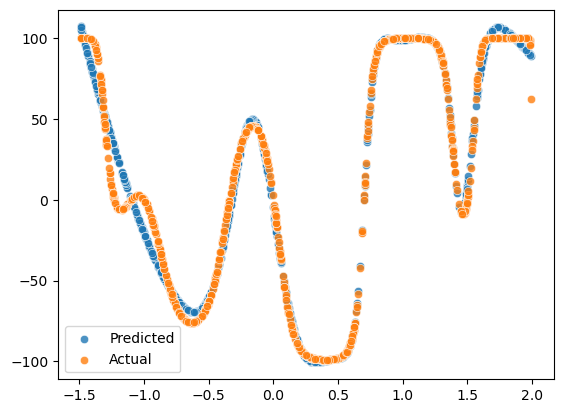

In [ ]:
test_regression(multimodal_large_test_X, multimodal_large_test_Y, 1000, sig_w3_big)

### TANGENS

Final mse tan_w1_small:  246.161756480252
Final mse tan_w2_small:  8.132953274665619
Final mse tan_w3_small:  83.47086685768325
Final mse tan_w1_medium:  63.68707407836769
Final mse tan_w2_medium:  6.907746670487759
Final mse tan_w3_medium:  6.174231922688451
Final mse tan_w1_big:  61.599226910747205
Final mse tan_w2_big:  6.738728233451045
Final mse tan_w3_big:  6.087965807683572


<Axes: >

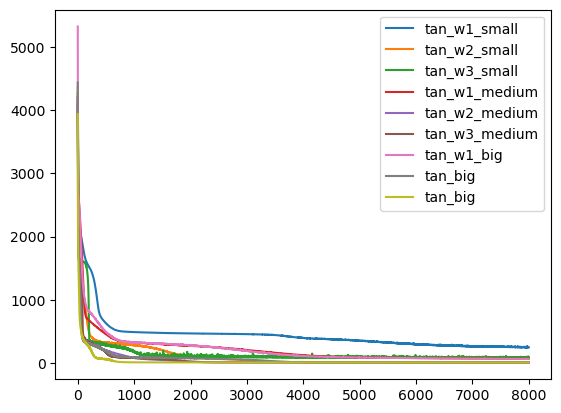

In [ ]:
print('Final mse tan_w1_small: ', tan_w1_small.loss_record[-1])
print('Final mse tan_w2_small: ', tan_w2_small.loss_record[-1])
print('Final mse tan_w3_small: ', tan_w3_small.loss_record[-1])
print('Final mse tan_w1_medium: ', tan_w1_medium.loss_record[-1])
print('Final mse tan_w2_medium: ', tan_w2_medium.loss_record[-1])
print('Final mse tan_w3_medium: ', tan_w3_medium.loss_record[-1])
print('Final mse tan_w1_big: ', tan_w1_big.loss_record[-1])
print('Final mse tan_w2_big: ', tan_w2_big.loss_record[-1])
print('Final mse tan_w3_big: ', tan_w3_big.loss_record[-1])
sns.lineplot(tan_w1_small.loss_record, label = 'tan_w1_small')
sns.lineplot(tan_w2_small.loss_record, label = 'tan_w2_small')
sns.lineplot(tan_w3_small.loss_record, label = 'tan_w3_small')
sns.lineplot(tan_w1_medium.loss_record, label = 'tan_w1_medium')
sns.lineplot(tan_w2_medium.loss_record, label = 'tan_w2_medium')
sns.lineplot(tan_w3_medium.loss_record, label = 'tan_w3_medium')
sns.lineplot(tan_w1_big.loss_record, label = 'tan_w1_big')
sns.lineplot(tan_w2_big.loss_record, label = 'tan_big')
sns.lineplot(tan_w3_big.loss_record, label = 'tan_big')

test mse: 3.8678265234706677
test mse: 1.8707285906743536
test mse: 2.3242006305656226


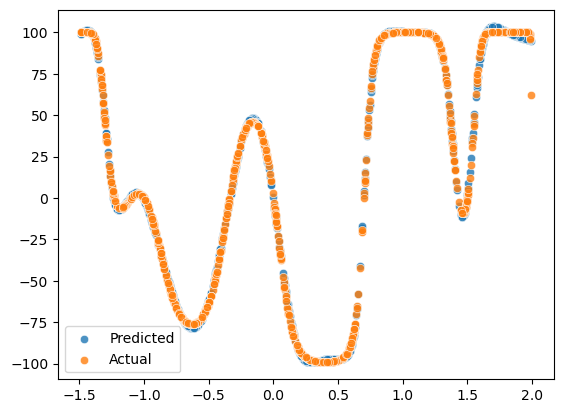

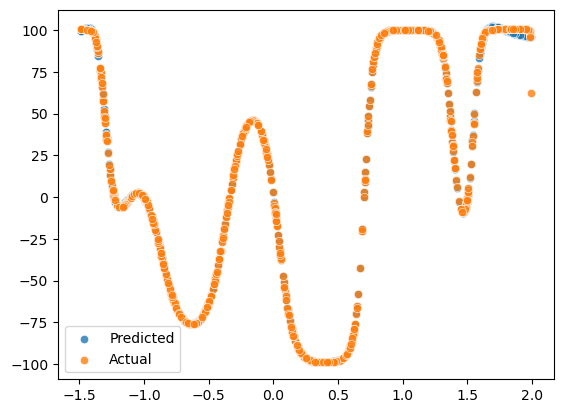

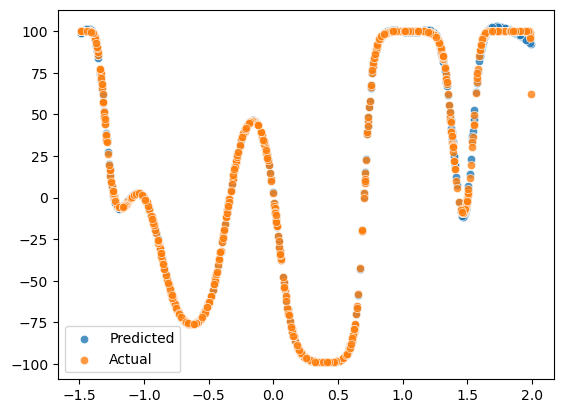

In [ ]:
test_regression(multimodal_large_test_X, multimodal_large_test_Y, 1000, tan_w2_small)
test_regression(multimodal_large_test_X, multimodal_large_test_Y, 1000, tan_w3_medium)
test_regression(multimodal_large_test_X, multimodal_large_test_Y, 1000, tan_w3_big)

### RELU

Final mse rel_w1_small:  578.1420968466789
Final mse rel_w2_small:  2352.046368050477
Final mse rel_w3_small:  395.281340349287
Final mse rel_w1_medium:  1631.5935402863674
Final mse rel_w2_medium:  387.5882773548083
Final mse rel_w3_medium:  5.676038538233876
Final mse rel_w1_big:  1438.6770367138422
Final mse rel_w2_big:  11.35376355777285
Final mse rel_w3_big:  7.8211343567611085


<Axes: >

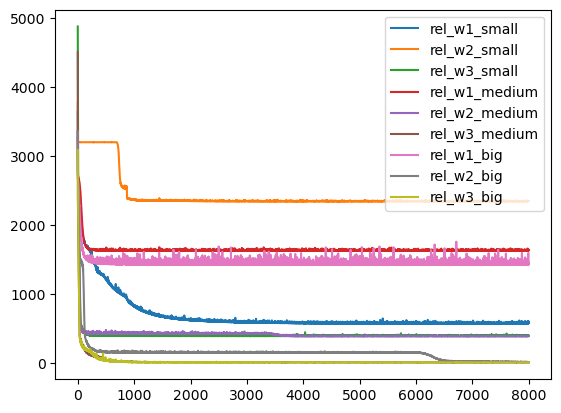

In [ ]:
print('Final mse rel_w1_small: ', rel_w1_small.loss_record[-1])
print('Final mse rel_w2_small: ', rel_w2_small.loss_record[-1])
print('Final mse rel_w3_small: ', rel_w3_small.loss_record[-1])
print('Final mse rel_w1_medium: ', rel_w1_medium.loss_record[-1])
print('Final mse rel_w2_medium: ', rel_w2_medium.loss_record[-1])
print('Final mse rel_w3_medium: ', rel_w3_medium.loss_record[-1])
print('Final mse rel_w1_big: ', rel_w1_big.loss_record[-1])
print('Final mse rel_w2_big: ', rel_w2_big.loss_record[-1])
print('Final mse rel_w3_big: ', rel_w3_big.loss_record[-1])
sns.lineplot(rel_w1_small.loss_record, label = 'rel_w1_small')
sns.lineplot(rel_w2_small.loss_record, label = 'rel_w2_small')
sns.lineplot(rel_w3_small.loss_record, label = 'rel_w3_small')
sns.lineplot(rel_w1_medium.loss_record, label = 'rel_w1_medium')
sns.lineplot(rel_w2_medium.loss_record, label = 'rel_w2_medium')
sns.lineplot(rel_w3_medium.loss_record, label = 'rel_w3_medium')
sns.lineplot(rel_w1_big.loss_record, label = 'rel_w1_big')
sns.lineplot(rel_w2_big.loss_record, label = 'rel_w2_big')
sns.lineplot(rel_w3_big.loss_record, label = 'rel_w3_big')

test mse: 3.2493033528039055
test mse: 3.4341063107461145


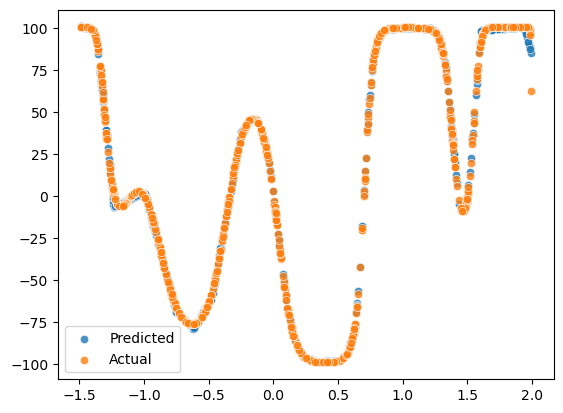

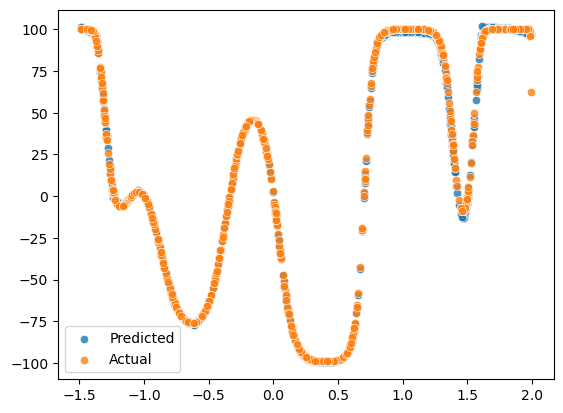

In [ ]:
test_regression(multimodal_large_test_X, multimodal_large_test_Y, 1000, rel_w3_medium)
test_regression(multimodal_large_test_X, multimodal_large_test_Y, 1000, rel_w3_big)

### STEPS

Final loss score:  10.595984796887569
test mse: 6.0680937073545484


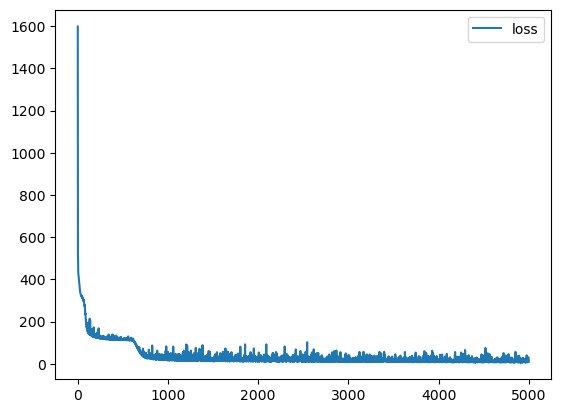

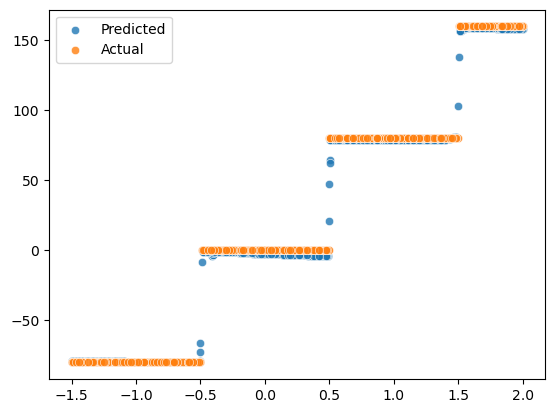

In [ ]:
rel_w3_medium_setps = network(architecture = np.array([1, 15, 15, 15, 1]), 
                        activation_functions = [None, ReLU, ReLU, ReLU, linear], 
                        activation_derivatives = [None, ReLU_derivative, ReLU_derivative, ReLU_derivative, linear_derivative], 
                        initiation_method = 'xavier')

rel_w3_medium_setps.learn(task = 'regression',
                     x = steps_large_train_X,
                     y = steps_large_train_Y,
                     epochs_number = 5000,
                     step = 0.075,
                     momentum_dumping = 0.90,
                     batch_size = 1000)

print('Final loss score: ', rel_w3_medium_setps.loss_record[-1])
sns.lineplot(rel_w3_medium_setps.loss_record, label = 'loss')

test_regression(x=steps_large_test_X, y=steps_large_test_Y, size=1000, network=rel_w3_medium_setps)

Final loss score:  13.793537593559703
test mse: 11.166285107880837


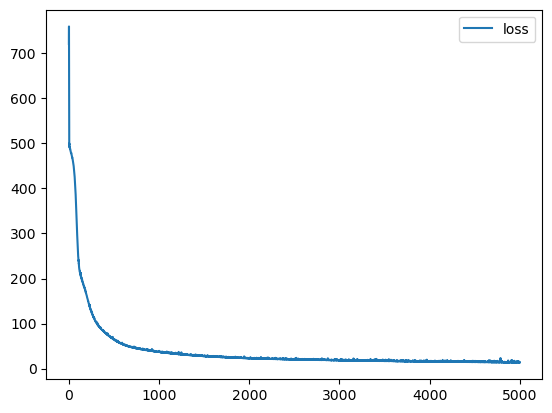

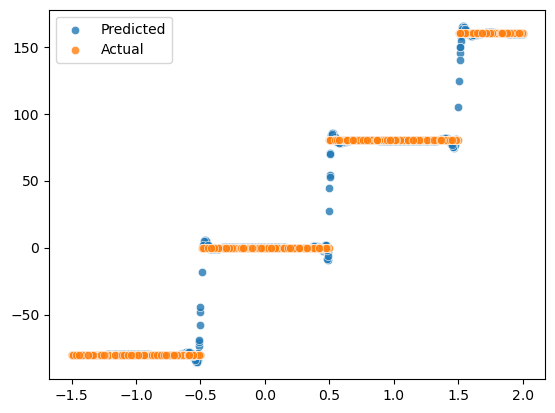

In [ ]:
tan_w3_big_setps = network(architecture = np.array([1, 30, 30, 30, 1]), 
                        activation_functions = [None, tanh, tanh, tanh, linear], 
                        activation_derivatives = [None, tanh_derivative, tanh_derivative, tanh_derivative, linear_derivative], 
                        initiation_method = 'xavier')

tan_w3_big_setps.learn(task = 'regression',
                     x = steps_large_train_X,
                     y = steps_large_train_Y,
                     epochs_number = 5000,
                     step = 0.025,
                     momentum_dumping = 0.90,
                     batch_size = 1000)

print('Final loss score: ', tan_w3_big_setps.loss_record[-1])
sns.lineplot(tan_w3_big_setps.loss_record, label = 'loss')

test_regression(x=steps_large_test_X, y=steps_large_test_Y, size=1000, network=tan_w3_big_setps)

Final loss score:  18.695645086876308
test mse: 15.049969413104929


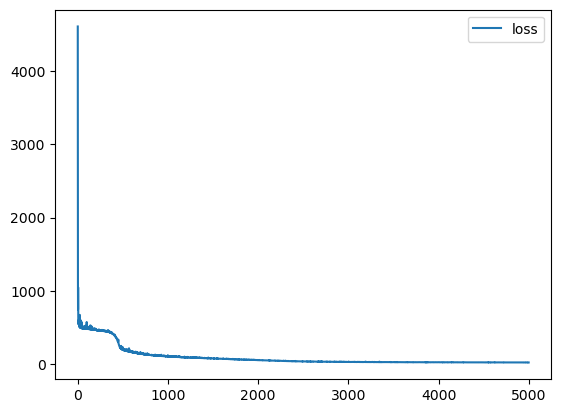

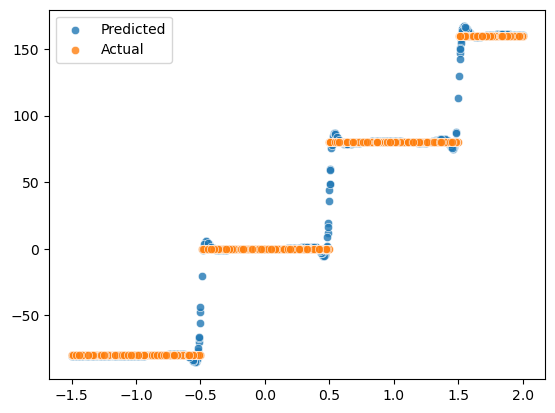

In [ ]:
sin_w3_big_setps = network(architecture = np.array([1, 30, 30, 30, 1]), 
                        activation_functions = [None, sigmoid, sigmoid, sigmoid, linear], 
                        activation_derivatives = [None, sigmoid_derivative, sigmoid_derivative, sigmoid_derivative, linear_derivative], 
                        initiation_method = 'xavier')

sin_w3_big_setps.learn(task = 'regression',
                     x = steps_large_train_X,
                     y = steps_large_train_Y,
                     epochs_number = 5000,
                     step = 0.25,
                     momentum_dumping = 0.90,
                     batch_size = 1000)

print('Final loss score: ', sin_w3_big_setps.loss_record[-1])
sns.lineplot(sin_w3_big_setps.loss_record, label = 'loss')

test_regression(x=steps_large_test_X, y=steps_large_test_Y, size=1000, network=sin_w3_big_setps)

### RINGS3

Final f1_score:  0.9984974954412836
Final loss score:  0.010841143815060614
test cross entropy: 0.3152396488339384
test f-measure: 0.9311345985354234


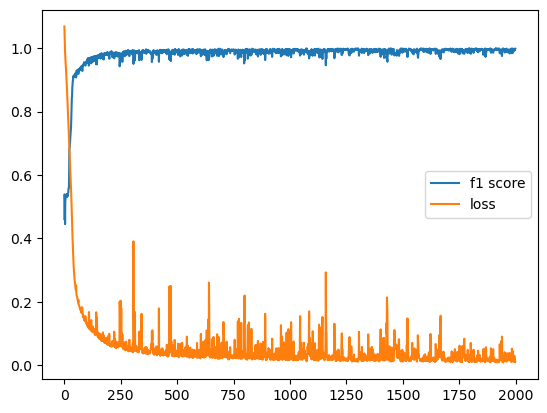

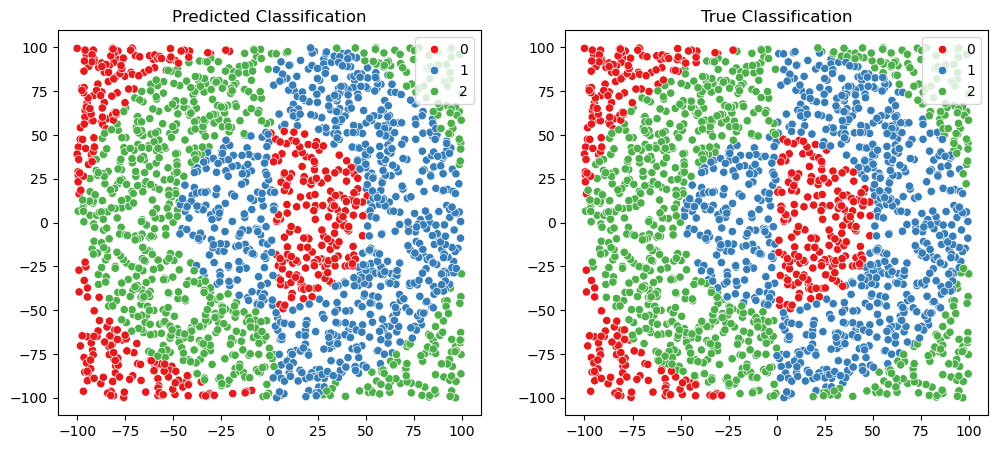

In [ ]:
rel_w3_medium_rings3 = network(architecture = np.array([2, 15, 15, 15, 3]), 
                        activation_functions = [None, ReLU, ReLU, ReLU, softmax], 
                        activation_derivatives = [None, ReLU_derivative, ReLU_derivative, ReLU_derivative, None], 
                        initiation_method = 'xavier')

rel_w3_medium_rings3.learn(task = 'classification',
                     x = [rings3_train_X, rings3_train_Y],
                     y = rings3_train_C,
                     epochs_number = 2000,
                     step = 0.01,
                     momentum_dumping = 0.90,
                     batch_size = 150)

print('Final f1_score: ', rel_w3_medium_rings3.f1_score[-1])
print('Final loss score: ', rel_w3_medium_rings3.loss_record[-1])
sns.lineplot(rel_w3_medium_rings3.f1_score, label = 'f1 score')
sns.lineplot(rel_w3_medium_rings3.loss_record, label = 'loss')

test_classification([rings3_test_X, rings3_test_Y], rings3_test_C, rel_w3_medium_rings3)

Final f1_score:  0.9873360934566173
Final loss score:  0.04086028192104114
test cross entropy: 0.3373992470437238
test f-measure: 0.9238769384825035


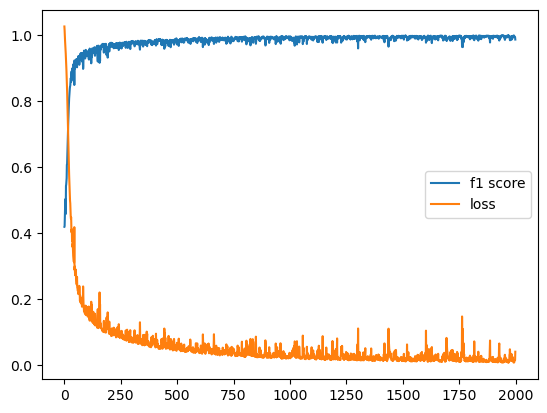

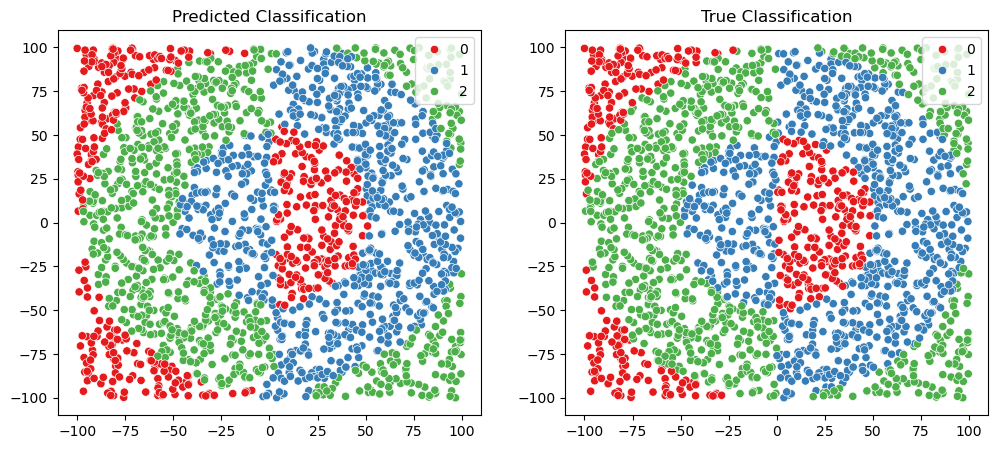

In [ ]:
tan_w3_big_rings3 = network(architecture = np.array([2, 30, 30, 30, 3]),
                        activation_functions = [None, tanh, tanh, tanh, softmax], 
                        activation_derivatives = [None, tanh_derivative, tanh_derivative, tanh_derivative, None], 
                        initiation_method = 'xavier')

tan_w3_big_rings3.learn(task = 'classification',
                     x = [rings3_train_X, rings3_train_Y],
                     y = rings3_train_C,
                     epochs_number = 2000,
                     step = 0.01,
                     momentum_dumping = 0.90,
                     batch_size = 150)

print('Final f1_score: ', tan_w3_big_rings3.f1_score[-1])
print('Final loss score: ', tan_w3_big_rings3.loss_record[-1])
sns.lineplot(tan_w3_big_rings3.f1_score, label = 'f1 score')
sns.lineplot(tan_w3_big_rings3.loss_record, label = 'loss')

test_classification([rings3_test_X, rings3_test_Y], rings3_test_C, tan_w3_big_rings3)

Final f1_score:  0.9920516110133915
Final loss score:  0.029534108402259368
test cross entropy: 0.2934124092572175
test f-measure: 0.9140636591516178


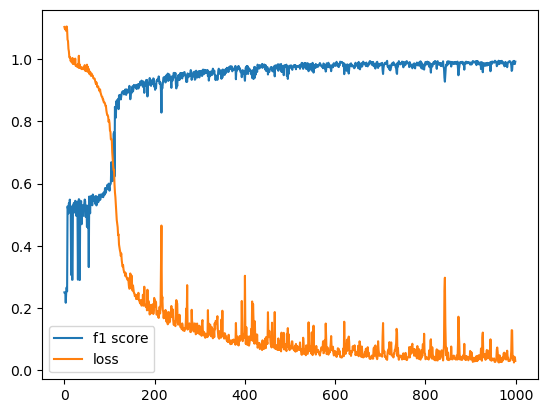

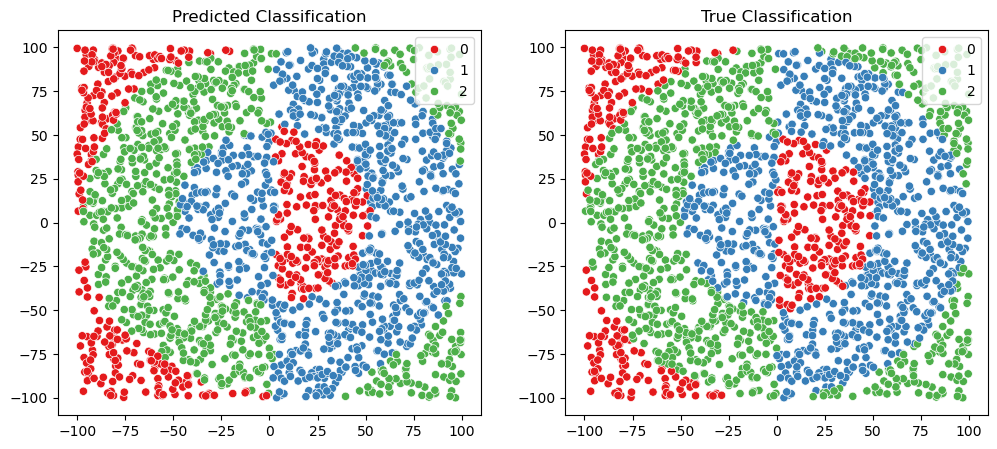

In [ ]:
sig_w3_big_rings3 = network(architecture = np.array([2, 30, 30, 30, 3]),
                        activation_functions = [None, sigmoid, sigmoid, sigmoid, softmax], 
                        activation_derivatives = [None, sigmoid_derivative, sigmoid_derivative, sigmoid_derivative, None], 
                        initiation_method = 'xavier')

sig_w3_big_rings3.learn(task = 'classification',
                     x = [rings3_train_X, rings3_train_Y],
                     y = rings3_train_C,
                     epochs_number = 1000,
                     step = 0.1,
                     momentum_dumping = 0.90,
                     batch_size = 150)

print('Final f1_score: ', sig_w3_big_rings3.f1_score[-1])
print('Final loss score: ', sig_w3_big_rings3.loss_record[-1])
sns.lineplot(sig_w3_big_rings3.f1_score, label = 'f1 score')
sns.lineplot(sig_w3_big_rings3.loss_record, label = 'loss')

test_classification([rings3_test_X, rings3_test_Y], rings3_test_C, sig_w3_big_rings3)

### RINGS5

Final f1_score:  0.9544099531400634
Final loss score:  0.19214925714536157
test cross entropy: 0.6307838537956917
test f-measure: 0.7125076349175369


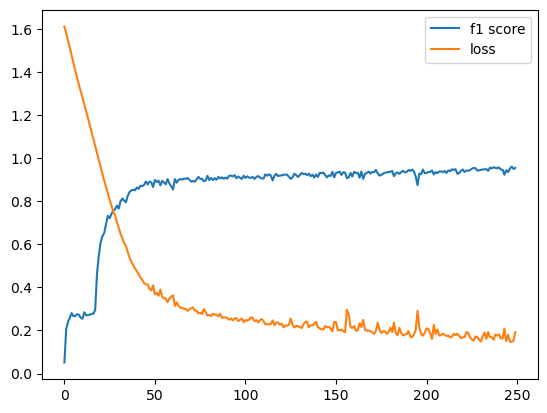

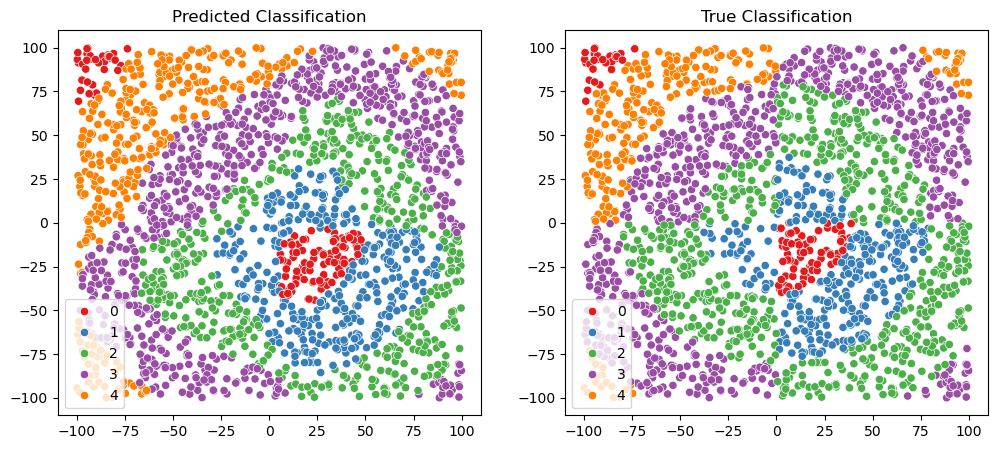

In [ ]:
rel_w3_medium_rings5 = network(architecture = np.array([2, 15, 15, 15, 5]), 
                        activation_functions = [None, ReLU, ReLU, ReLU, softmax], 
                        activation_derivatives = [None, ReLU_derivative, ReLU_derivative, ReLU_derivative, None], 
                        initiation_method = 'xavier')

rel_w3_medium_rings5.learn(task = 'classification',
                     x = [rings5_train_X, rings5_train_Y],
                     y = rings5_train_C,
                     epochs_number = 250,
                     step = 0.01,
                     momentum_dumping = 0.90,
                     batch_size = 125)

print('Final f1_score: ', rel_w3_medium_rings5.f1_score[-1])
print('Final loss score: ', rel_w3_medium_rings5.loss_record[-1])
sns.lineplot(rel_w3_medium_rings5.f1_score, label = 'f1 score')
sns.lineplot(rel_w3_medium_rings5.loss_record, label = 'loss')

test_classification([rings5_test_X, rings5_test_Y], rings5_test_C, rel_w3_medium_rings5)

Final f1_score:  0.989037598957146
Final loss score:  0.078771836011746
test cross entropy: 0.7312963788077216
test f-measure: 0.6762949693485919


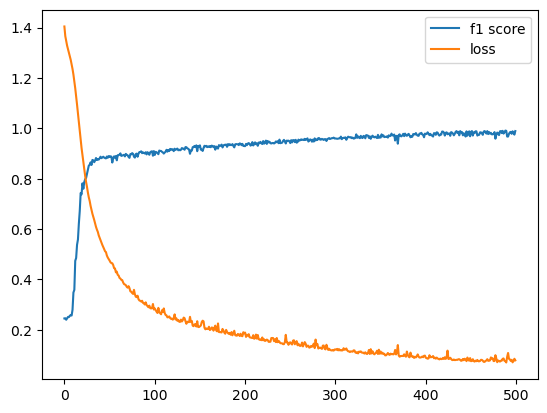

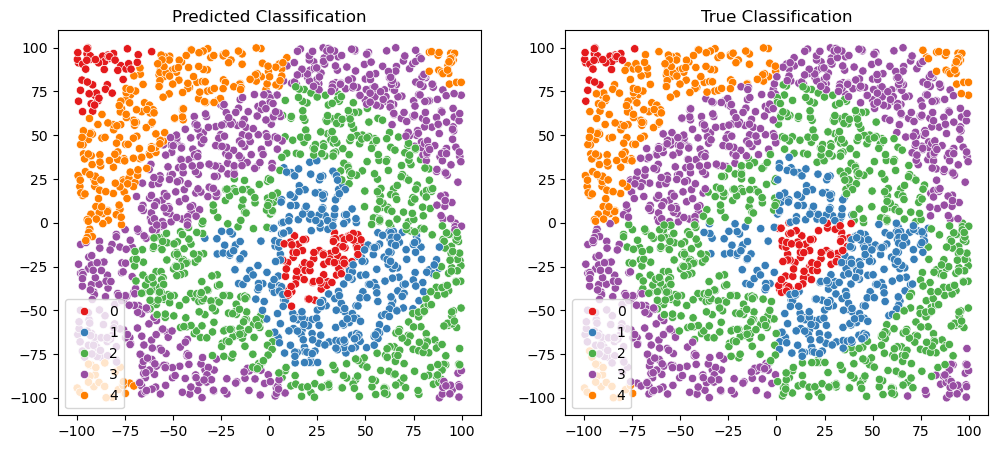

In [ ]:
tan_w3_big_rings5 = network(architecture = np.array([2, 30, 30, 30, 5]),
                        activation_functions = [None, tanh, tanh, tanh, softmax], 
                        activation_derivatives = [None, tanh_derivative, tanh_derivative, tanh_derivative, None], 
                        initiation_method = 'xavier')

tan_w3_big_rings5.learn(task = 'classification',
                     x = [rings5_train_X, rings5_train_Y],
                     y = rings5_train_C,
                     epochs_number = 500,
                     step = 0.01,
                     momentum_dumping = 0.90,
                     batch_size = 125)

print('Final f1_score: ', tan_w3_big_rings5.f1_score[-1])
print('Final loss score: ', tan_w3_big_rings5.loss_record[-1])
sns.lineplot(tan_w3_big_rings5.f1_score, label = 'f1 score')
sns.lineplot(tan_w3_big_rings5.loss_record, label = 'loss')

test_classification([rings5_test_X, rings5_test_Y], rings5_test_C, tan_w3_big_rings5)

Final f1_score:  0.9393791171442178
Final loss score:  0.16268869913275472
test cross entropy: 0.6243176065118754
test f-measure: 0.6603763356166886


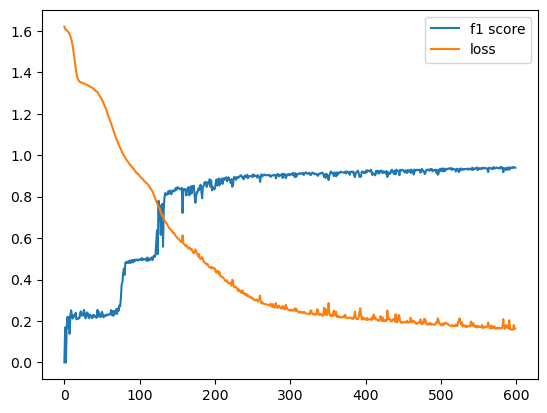

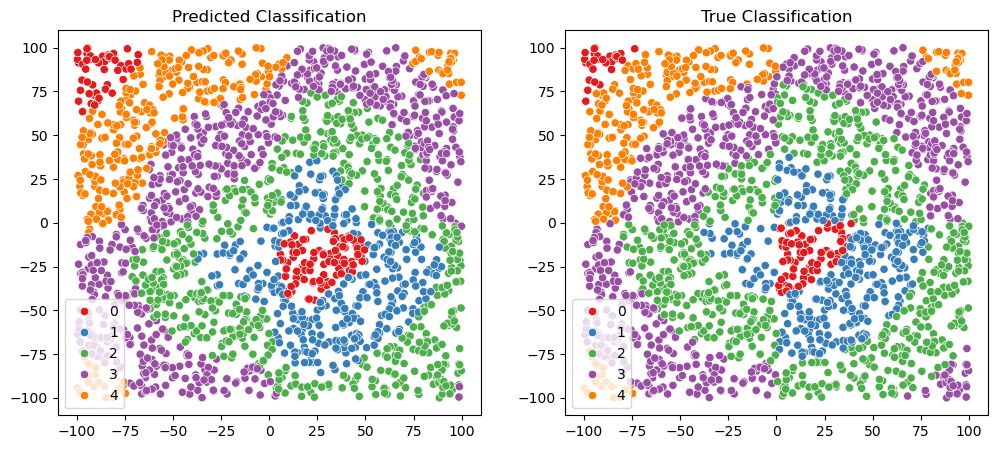

In [ ]:
sig_w3_big_rings5 = network(architecture = np.array([2, 30, 30, 30, 5]),
                        activation_functions = [None, sigmoid, sigmoid, sigmoid, softmax], 
                        activation_derivatives = [None, sigmoid_derivative, sigmoid_derivative, sigmoid_derivative, None], 
                        initiation_method = 'xavier')

sig_w3_big_rings5.learn(task = 'classification',
                     x = [rings5_train_X, rings5_train_Y],
                     y = rings5_train_C,
                     epochs_number = 600,
                     step = 0.05,
                     momentum_dumping = 0.90,
                     batch_size = 125)

print('Final f1_score: ', sig_w3_big_rings5.f1_score[-1])
print('Final loss score: ', sig_w3_big_rings5.loss_record[-1])
sns.lineplot(sig_w3_big_rings5.f1_score, label = 'f1 score')
sns.lineplot(sig_w3_big_rings5.loss_record, label = 'loss')

test_classification([rings5_test_X, rings5_test_Y], rings5_test_C, sig_w3_big_rings5)

### Wnioski
##### liniowa
wyraźne ograniczenie modeli przez dobór funkcji aktywacji, nie możność do przebicia się przez pułap 4398 MSE, niemalże identyczne wyniki uczenia, duża niestabilność przy wielu neuronach i niewielu warstwach 

##### sigmoida
bardzo zbliżone tempo uczenia i końcowy wynik dla badanych architektór, najsłabsze wyniki końcowe z 3 poważnych architektór (sigmoida, tanh, ReLU), największy model zdawał się móc osiągnąć lepszy wynik przy dalszym uczeniu, ważniejsza liczba warstw niż liczba neuronów w warstwie

##### tangens hiperboliczny
szybka i daleko idąca zbieżność nawet dla najmniejszych modeli, "średnio" najlepsza funkcja aktywacji, ważniejsza liczba warstw niż liczba neuronów w warstwie, ponad połowa architektór zwróciła niemal najlepszy wynik z wszystkich testów, najmniejszy z modeli mógł uczyć się nawet dłużej

##### ReLU
wyraźna preferencja większej liczby warstw, z wyjątkiem modeli o małej liczbie neuronów, drugi najlepszy "średni", ale pojedynczy najlepszy (rel_w3_medium) wynik pod względem funkcji aktywacji, liczba warstw ważniejsza niż liczba neuronów w warstwie, największe dysproporcje między architekturami

## 6. Zjawisko przeuczenia + regularyzacja
Ostatecznym celem każdego uczenia maszynowego jest przygotowanie maszyny do wykonywania zadania jako takiego, bez względu na dane wejściowe. Nie zależy nam jedynie na dobrych wynikach w trakcie treningu ale też osiągnięciu jakiejś formy generalizacji zdolności modelu. Aby to osiągnąć wprowadza się pewne narzędzia zaburzające pracę sieci w trakcie treningu, tak aby zmusiać ją do bardziej uniwersalnego sposóbu działania.

W tym zadaniu taką regularyzację zaimplementowałem w postaci dropoutu, regularyzacji wag L1 oraz L2 jak również w opcji uczenia zatrzymującej dalszy trening przy rosnącej średniej kroczącej błędu na zbiorze testowym.

In [ ]:
# implementacja NN6

def sigmoid(x):
	return 1/(1+np.e**(-x))

def sigmoid_derivative(x):
	return sigmoid(x) * (1 - sigmoid(x))

def linear(x):
	return x

def linear_derivative(x):
	return 1

def softmax(x):
    if x.ndim == 1:
        x = x.reshape(1, -1)  
    
    e_x = np.exp(x - np.max(x, axis=1, keepdims=True))
    return e_x / np.sum(e_x, axis=1, keepdims=True)

def tanh(x):
	return (np.exp(x) - np.exp(-x)) / (np.exp(x) + np.exp(-x))

def tanh_derivative(x):
	return 1 - tanh(x)**2

def ReLU(x):
	return np.maximum(0, x)

def ReLU_derivative(x):
	return np.where(x > 0, 1, 0)

class network:
	def __init__(self, architecture, activation_functions, activation_derivatives, initiation_method):
		self.architecture = architecture
		self.activation_functions = activation_functions
		self.activation_derivatives = activation_derivatives
		self.weights_biases_initiation(initiation_method)
		self.loss_record = []
		self.f1_score = []
		self.mask = None

	def set_state(self, architecture, biases, weights, activation_functions):
		self.architecture = architecture
		self.biases = biases
		self.weights = weights
		self.activation_functions = activation_functions

	def weights_biases_initiation(self, initiation_method):
		self.weights = [None]
		self.biases = [None]
		self.weights_momentum = [None]
		self.biases_momentum = [None]
		self.weigths_rmsProp = [None]
		self.biases_rmsProp = [None]

		if initiation_method not in ['he', 'xavier', 'uniform']:
			print('Initiation method incorrect!')
			return 

		for i in range(len(self.architecture) - 1):
			input_dim = self.architecture[i]
			output_dim = self.architecture[i + 1]
			
			if initiation_method == 'he':
				weight_matrix = np.random.randn(input_dim, output_dim) * np.sqrt(2 / input_dim)
			elif initiation_method == 'xavier':
				weight_matrix = np.random.randn(input_dim, output_dim) * np.sqrt(1 / input_dim)
			elif initiation_method == 'uniform':
				weight_matrix = np.random.uniform(0, 1, (input_dim, output_dim))

			bias_vector = np.zeros((1, output_dim))
			
			self.weights_momentum.append(np.zeros(weight_matrix.shape))
			self.biases_momentum.append(np.zeros(bias_vector.shape))
			self.weigths_rmsProp.append(np.zeros(weight_matrix.shape))
			self.biases_rmsProp.append(np.zeros(bias_vector.shape))
			self.weights.append(weight_matrix)
			self.biases.append(bias_vector)

	def forward(self, X, dropout_p=None):
		# as a convention, for convinience, zeroth index of activations is raw input, i add None to preactivations for uniform indexing
		self.activations = [X]
		self.preactivations = [None]

		for i in range(0, len(self.architecture)-1):
			z = np.dot(self.activations[i], self.weights[i+1]) + self.biases[i+1]
			self.preactivations.append(z)
			
			a = self.activation_functions[i+1](z)
			if dropout_p != None:
				a = a * self.mask[i+1]

			self.activations.append(a)
	
	def check_MSE(self, x, y):
		self.forward(x)
		prediction = self.destandardize_data(self.activations[-1], 'y')
		correct = self.destandardize_data(y, 'y')
		return np.mean((correct - prediction) ** 2)
	
	def check_categorical_crossentropy_loss(self, x, y, epsilon=1e-12):
		self.forward(x)
		prediction = self.activations[-1]
		prediction = np.clip(prediction, epsilon, 1.0 - epsilon)
		loss = -np.sum(y * np.log(prediction), axis=1)
		return np.mean(loss)

	def check_fmeasure(self, x, y):
		self.forward(x)
		prediction = np.argmax(self.activations[-1], axis=1)
		correct = np.argmax(y, axis=1)

		labels = np.unique(y)

		true_positives = np.zeros(len(labels))
		false_positives = np.zeros(len(labels))
		false_negatives = np.zeros(len(labels))

		for i, label in enumerate(labels):
			true_positives[i] = np.sum((prediction == label) & (correct == label))
			false_positives[i] = np.sum((prediction == label) & (correct != label))
			false_negatives[i] = np.sum((prediction != label) & (correct == label))

		precision = true_positives / (true_positives+false_positives + 1e-10)
		recall = true_positives / (true_positives+false_negatives + 1e-10)

		f1_per_class = 2 * (precision * recall) / (precision + recall + 1e-10)
		return np.mean(f1_per_class)
	
	def visualize_network(self):
		G = nx.DiGraph()
		pos = {}
		edge_colors = []
		edge_widths = []
		
		for layer_idx, num_nodes in enumerate(self.architecture):
			for node_idx in range(num_nodes):
				node_name = f"L{layer_idx}_N{node_idx}"
				pos[node_name] = (layer_idx, -node_idx)  
				G.add_node(node_name)
				
				if layer_idx > 0: 
					for prev_idx in range(self.architecture[layer_idx - 1]):
						prev_name = f"L{layer_idx-1}_N{prev_idx}"
						weight = self.weights[layer_idx][prev_idx][node_idx]

						if weight != 0:
							G.add_edge(prev_name, node_name)
							edge_colors.append('red' if weight < 0 else 'green')
							edge_widths.append(np.log(abs(weight)))
		
		plt.figure(figsize=(10, 5))
		nx.draw(G, pos, with_labels=True, node_size=700, node_color="skyblue", edge_color=edge_colors, width=edge_widths)
		plt.show()

	def backward(self, Y, dropout_p=None, reg_type=None, lambda_=None):
		self.error = [None] * (len(self.weights))
		self.weights_gradient = [None] * (len(self.weights))
		self.biases_gradient = [None] * (len(self.weights))

		# if task == 'regression':
		# 	self.error[-1] = (self.activations[-1] - Y) * self.activation_derivatives[-1](self.preactivations[-1])
		# if task == 'classification':
		# 	self.error[-1] = (self.activations[-1] - Y)
		
		# normalnie to to kwestia czy regresja czy klasyfikacja ale żeby spróbować klasyfikacji dla liniowej ostatniej warstywy robie tak 
		if self.activation_functions[-1] != softmax: 
			self.error[-1] = (self.activations[-1] - Y) * self.activation_derivatives[-1](self.preactivations[-1])
		else:
			self.error[-1] = (self.activations[-1] - Y)

		for i in reversed(range(1, len(self.error) - 1)):
			self.error[i] = np.dot(self.error[i+1], self.weights[i+1].T) * self.activation_derivatives[i](self.preactivations[i])
			if dropout_p != None:
				self.error[i] = self.error[i] * self.mask[i]
		
		for i in range(1, len(self.error)):
			# self.weights_gradient[i] = -step * np.dot(self.activations[i-1].T, self.error[i]) / self.error[i].shape[0]
			# self.biases_gradient[i] = (-step * np.mean(self.error[i], axis=0)).reshape(1, -1)
			self.weights_gradient[i] = np.dot(self.activations[i-1].T, self.error[i]) / self.error[i].shape[0]
			self.biases_gradient[i] = (np.mean(self.error[i], axis=0)).reshape(1, -1)

			if reg_type == 'L1':
				self.weights_gradient[i] += lambda_ * np.sign(self.weights[i])
			elif reg_type == 'L2':
				self.weights_gradient[i] += lambda_ * self.weights[i]

	def prepeare_batches(self, x, y, task, batch_size=None):
			n = len(x)
			if batch_size == None:
				batch_number = 1
			else:
				batch_number = int(np.ceil(n / batch_size))

			indices = np.random.permutation(n)
			x_shuffled = x[indices]
			y_shuffled = y[indices]

			x_batched = np.array_split(x_shuffled, batch_number)
			y_batched = np.array_split(y_shuffled, batch_number)

			return x_batched, y_batched, batch_number
		
	def prepare_data(self, x, y, task):
		if type(x) == list:
			input_size = len(x)
			for i in range(input_size):
				size = len(x[i])
				x[i] = np.reshape(x[i], (size, 1))
			x = np.hstack(x)
		else:
			x = np.reshape(x, (len(x), 1))
		
		y = np.reshape(y, (len(y), 1))

		x_standardized = self.standardize_data(x, 'x')

		if task == 'classification':
			labels = np.unique(y)
			label_to_index = {label: index for index, label in enumerate(labels)}
			indexes = np.array([label_to_index[label] for label in y.flatten()])

			labels_num = len(labels)
			y = np.eye(labels_num)[indexes]

			return x_standardized, y
		else:
			y_standardized = self.standardize_data(y, 'y')

			return x_standardized, y_standardized
	
	def learn_old(self, x, y, step, iterations):
		x = self.standardize_data(x, 'x')
		y = self.standardize_data(y, 'y')

		for e in range(iterations):
			self.forward(x)
			self.backward(y, step)
			
			for i in range(1, len(self.architecture)):
					self.weights[i] += self.weights_gradient[i]
					self.biases[i] += self.biases_gradient[i]

			self.mse_record.append(self.check_MSE(x, y))

	def learn(self, task, x, y, epochs_number, step, momentum_dumping=None, rmsprop_dumping=None, batch_size=None, dropout_p=None, reg_type=None, lambda_=None):
		if momentum_dumping != None and rmsprop_dumping != None:
			print('Both momentum and rmsProp parameters were passed! Choose one.')
			return 
		
		if task not in ['classification', 'regression']:
			print('Incorrect network task! Choose classification or regression.')
			return
		
		x, y = self.prepare_data(x, y, task)
		
		for e in range(epochs_number):
			x_batches, y_batches, batch_number = self.prepeare_batches(x, y, task, batch_size)

			for b in range(batch_number):
				if dropout_p != None:
					inner_layers = self.architecture[1:-1]
					neurons_count = np.sum(inner_layers)

					self.mask = (np.random.rand(neurons_count) > dropout_p).astype(int)
					splits = np.cumsum(inner_layers[:-1])
					self.mask = np.split(self.mask, splits)
					mask_first = np.array([1] * self.architecture[0])
					mask_last = np.array([1] * self.architecture[-1])
					self.mask = [mask_first] + self.mask + [mask_last]

					input_size = x_batches[b].shape[0]
					self.mask = [np.tile(array, (input_size, 1)) for array in self.mask]
					
				self.forward(x_batches[b], dropout_p)
				self.backward(y_batches[b], dropout_p, reg_type, lambda_)

				for i in range(1, len(self.architecture)):
					if momentum_dumping == None and rmsprop_dumping == None:
						# simple learning
						self.weights[i] -= self.weights_gradient[i] * step
						self.biases[i] -= self.biases_gradient[i] * step

					elif momentum_dumping != None and rmsprop_dumping == None:
						# learning with momentum
						self.weights_momentum[i] = self.weights_momentum[i] * momentum_dumping - self.weights_gradient[i]
						self.biases_momentum[i] = self.biases_momentum[i] * momentum_dumping - self.biases_gradient[i]
						self.weights[i] += self.weights_momentum[i] * step
						self.biases[i] += self.biases_momentum[i] * step

					elif momentum_dumping == None and rmsprop_dumping != None:
						# learning with rmsProp
						epsilon = 1e-8
						self.weigths_rmsProp[i] = rmsprop_dumping * self.weigths_rmsProp[i] + (1 - rmsprop_dumping) * self.weights_gradient[i]**2
						self.biases_rmsProp[i] = rmsprop_dumping * self.biases_rmsProp[i] + (1 - rmsprop_dumping) * self.biases_gradient[i]**2
						self.weights[i] -= step/(np.sqrt(self.weigths_rmsProp[i] + epsilon)) * self.weights_gradient[i]
						self.biases[i] -= step/(np.sqrt(self.biases_rmsProp[i] + epsilon)) * self.biases_gradient[i]

			if task == 'regression':
				self.loss_record.append(self.check_MSE(np.vstack(x_batches), np.vstack(y_batches)))
			if task == 'classification':
				self.loss_record.append(self.check_categorical_crossentropy_loss(np.vstack(x_batches), np.vstack(y_batches)))
				self.f1_score.append(self.check_fmeasure(np.vstack(x_batches), np.vstack(y_batches)))

	def standardize_data(self, data, type):
		mean = np.mean(data, axis=0)
		std = np.std(data, axis=0)
		data_new = (data - mean) / std

		if type == 'x':
			self.standardize_params_x = (mean, std)
		if type == 'y':
			self.standardize_params_y = (mean, std)

		return data_new

	def destandardize_data(self, data, type):
		if type == 'x':
			return data * self.standardize_params_x[1] + self.standardize_params_x[0]
		if type == 'y':
			return data * self.standardize_params_y[1] + self.standardize_params_y[0]

def test_regression(x, y, size, network):
	x = x.reshape(size, 1)
	y = y.reshape(size, 1)
	x_std = (x - network.standardize_params_x[0]) / network.standardize_params_x[1]
	
	network.forward(x_std)
	y_pred_std = network.activations[-1]
	y_pred = network.destandardize_data(y_pred_std, 'y')

	print('test mse:', np.mean((y - y_pred) ** 2))
	plt.figure()
	sns.scatterplot(x=x.flatten(), y=y_pred.flatten(), alpha=0.8, label='Predicted')
	sns.scatterplot(x=x.flatten(), y=y.flatten(), alpha=0.8, label='Actual')

def test_classification(x, y, network):
	task = 'classification'

	x_prep, y_prep = network.prepare_data(x, y, task)
	crossentropy = network.check_fmeasure(x_prep, y_prep)
	fmeasure = network.check_fmeasure(x_prep, y_prep)

	print('test cross entropy:', crossentropy)
	print('test f-measure:', fmeasure)
	classification = np.argmax(network.activations[-1], axis=1)

	fig, axes = plt.subplots(1, 2, figsize=(12, 5))
	sns.scatterplot(x=x[0].flatten(), y=x[1].flatten(), hue=classification, ax=axes[0], palette='Set1')
	axes[0].set_title("Predicted Classification")
	sns.scatterplot(x=x[0].flatten(), y=x[1].flatten(), hue=y.flatten(), ax=axes[1], palette='Set1')
	axes[1].set_title("True Classification")

def early_stopping_learn(network, x_train, y_train, x_test, y_test, patience, window, task, epochs_number, step, momentum_dumping=None, rmsprop_dumping=None, batch_size=None, dropout_p=None, reg_type=None, lambda_=None):
	best_score = np.inf
	score = []
	x_test, y_test = network.prepare_data(x_test, y_test, task)

	for e in range(epochs_number):
		network.learn(task, x_train, y_train, 1, step, momentum_dumping, rmsprop_dumping, batch_size, dropout_p, reg_type, lambda_)
		if task == 'regression':
			score.append(network.check_MSE(x_test, y_test))
		else:
			score.append(network.check_categorical_crossentropy_loss(x_test, y_test))

		if e > window:
			mean = np.mean(score[e-window:])
			if mean < best_score:	
				best_score = mean
				current_patience = patience 
			else:
				current_patience -= 1
				# print('patience down to', current_patience, mean, 'climbs', best_score)
				if current_patience < 0:
					print('Early stopping epoch', e)
					break


### MULTIMODAL SPARSE

Early stopping epoch 1813
Final loss score:  295.79534426835517
test mse: 624.1356952283471


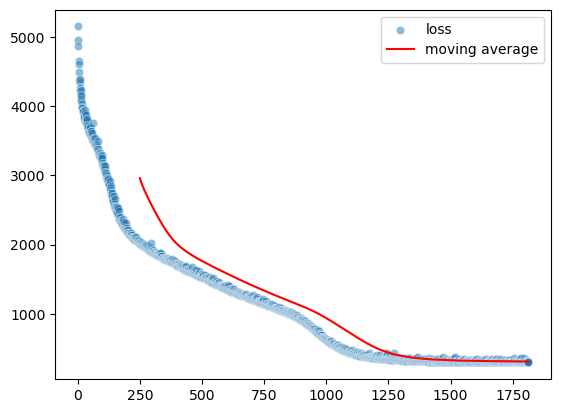

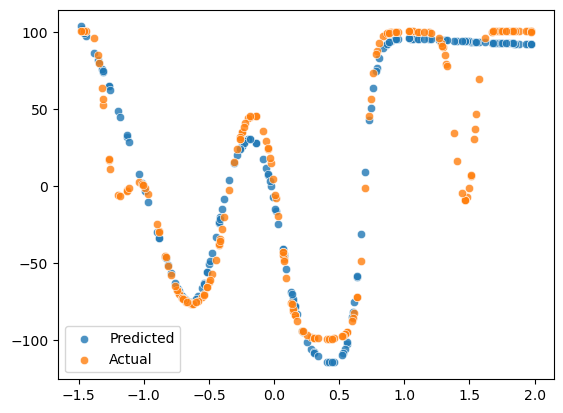

In [ ]:
# test 122 to beat

network_multiexperiment = network(architecture = np.array([1, 15, 15, 1]), 
                        activation_functions = [None, sigmoid, sigmoid, linear], 
                        activation_derivatives = [None, sigmoid_derivative, sigmoid_derivative, linear_derivative], 
                        initiation_method = 'xavier')	

window = 250
early_stopping_learn(network_multiexperiment,
                     x_train = multimodal_sparse_train_X,
                     y_train = multimodal_sparse_train_Y,
                     x_test = multimodal_sparse_test_X,
                     y_test = multimodal_sparse_test_Y,
                     patience = 150,
                     window = window,
                     task = 'regression',
                     epochs_number = 25000,
                     step = 0.01,
                     rmsprop_dumping = 0.90,
                     batch_size = 8,
                     dropout_p = 0,
                     reg_type = 'L1',
                     lambda_= 0.001)

m_average = np.convolve(network_multiexperiment.loss_record, np.ones(window)/window, mode='valid')
m_average = np.concatenate((np.full(window, np.nan), m_average))
print('Final loss score: ', network_multiexperiment.loss_record[-1])
sns.scatterplot(network_multiexperiment.loss_record, label = 'loss', alpha=0.5)
sns.lineplot(m_average, label = 'moving average', color='red')
test_regression(x=multimodal_sparse_test_X, y=multimodal_sparse_test_Y, size=200, network=network_multiexperiment)

### RINGS5 SPARSE

Early stopping epoch 687
Final loss score:  0.25337425339909
Final f1_score:  0.9028571428050389
test cross entropy: 0.6425397284933272
test f-measure: 0.6425397284933272


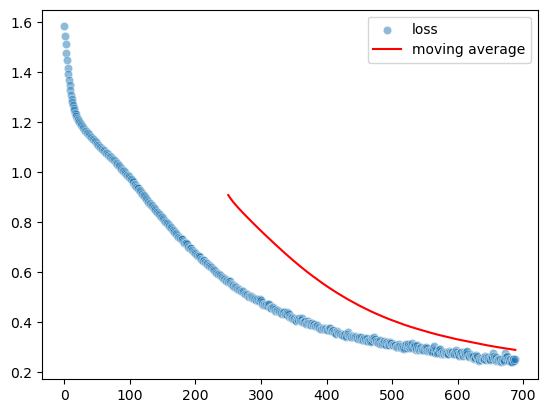

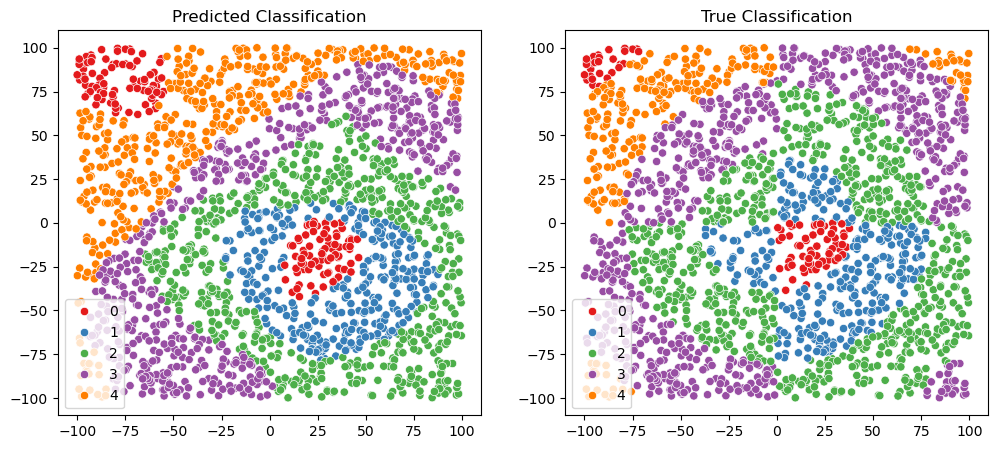

In [ ]:
# test 0.62 to beat

network_rings5 = network(architecture = np.array([2, 64, 64, 64, 5]),
                        activation_functions = [None, ReLU, ReLU, ReLU, softmax], 
                        activation_derivatives = [None, ReLU_derivative, ReLU_derivative, ReLU_derivative, None], 
                        initiation_method = 'xavier')

window = 250
early_stopping_learn(network_rings5,
                     x_train = [rings5_sparse_train_X, rings5_sparse_train_Y],
                     y_train = rings5_sparse_train_C,
                     x_test = [rings5_sparse_test_X, rings5_sparse_test_Y],
                     y_test = rings5_sparse_test_C,
                     patience = 150,
                     window = window,
                     task = 'classification',
                     epochs_number = 5000,
                     step = 0.0001,
                     rmsprop_dumping = 0.90,
                     batch_size = 4,
                     dropout_p = 0.1,
                     reg_type = 'L2',
                     lambda_= 0.001)

m_average = np.convolve(network_rings5.loss_record, np.ones(window)/window, mode='valid')
m_average = np.concatenate((np.full(window, np.nan), m_average))
print('Final loss score: ', network_rings5.loss_record[-1])
print('Final f1_score: ', network_rings5.f1_score[-1])
sns.scatterplot(network_rings5.loss_record, label = 'loss', alpha=0.5)
sns.lineplot(m_average, label = 'moving average', color='red')
test_classification([rings5_sparse_test_X, rings5_sparse_test_Y], rings5_sparse_test_C, network_rings5)

### RINGS3 BALANCE

Early stopping epoch 1831
Final loss score:  0.04715376337568929
Final f1_score:  0.9852997101436978
test cross entropy: 0.8667719023544398
test f-measure: 0.8667719023544398


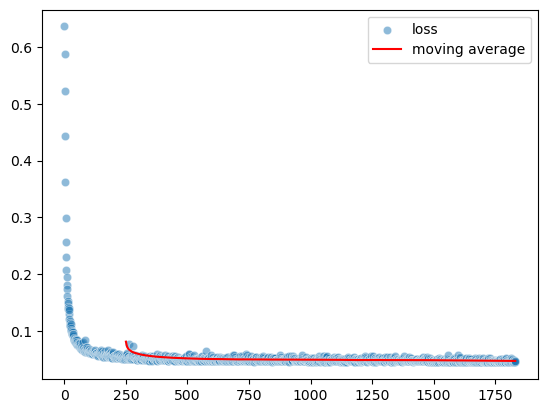

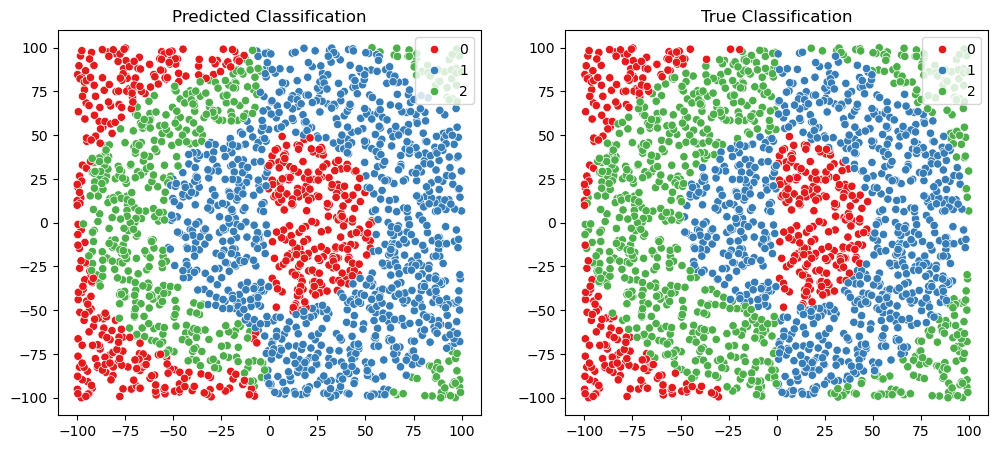

In [ ]:
# test 0.90 to beat

network_rings3 = network(architecture = np.array([2, 64, 64, 3]),
                        activation_functions = [None, ReLU, ReLU, softmax], 
                        activation_derivatives = [None, ReLU_derivative, ReLU_derivative, None], 
                        initiation_method = 'xavier')

window = 250
early_stopping_learn(network_rings3,
                     x_train = [rings3_balance_train_X, rings3_balance_train_Y],
                     y_train = rings3_balance_train_C,
                     x_test = [rings3_balance_test_X, rings3_balance_test_Y],
                     y_test = rings3_balance_test_C,
                     patience = 150,
                     window = window,
                     task = 'classification',
                     epochs_number = 5000,
                     step = 0.001,
                     rmsprop_dumping = 0.90,
                     batch_size = 32,
                     dropout_p = 0,
                     reg_type = 'L2',
                     lambda_= 0.001)

m_average = np.convolve(network_rings3.loss_record, np.ones(window)/window, mode='valid')
m_average = np.concatenate((np.full(window, np.nan), m_average))
print('Final loss score: ', network_rings3.loss_record[-1])
print('Final f1_score: ', network_rings3.f1_score[-1])
sns.scatterplot(network_rings3.loss_record, label = 'loss', alpha=0.5)
sns.lineplot(m_average, label = 'moving average', color='red')
test_classification([rings3_balance_test_X, rings3_balance_test_Y], rings3_balance_test_C, network_rings3)

### XOR3 BALANCE

Early stopping epoch 613
Final loss score:  0.01103325909287755
Final f1_score:  0.9724373276823208
test cross entropy: 0.8412320393252329
test f-measure: 0.8412320393252329


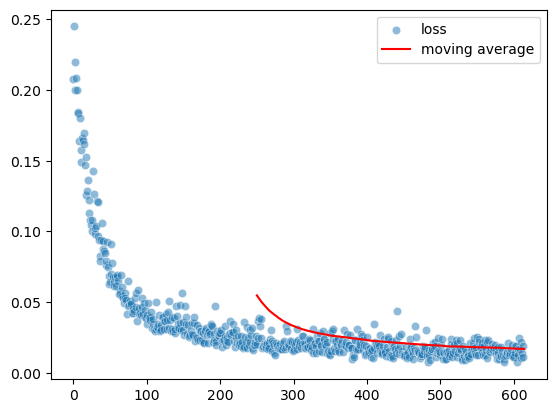

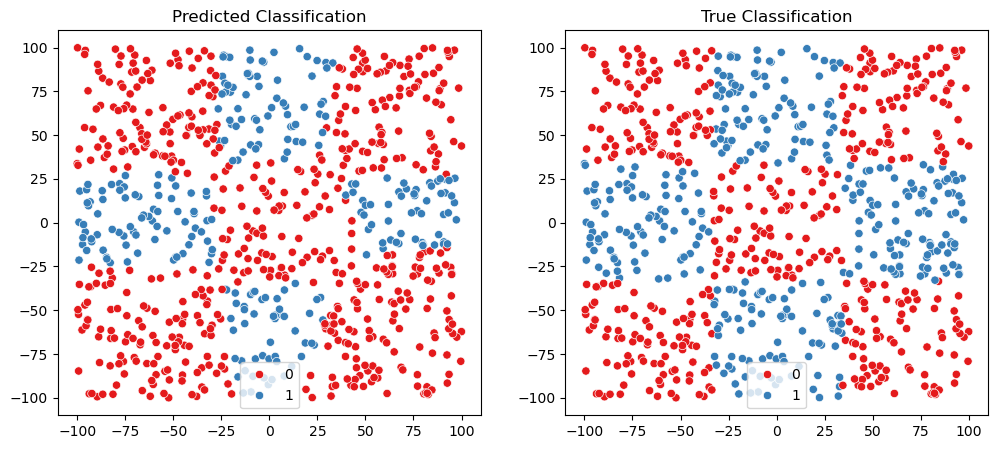

In [ ]:
# test 0.86 to beat

network_xor = network(architecture = np.array([2, 32, 32, 2]),
                        activation_functions = [None, ReLU, ReLU, softmax], 
                        activation_derivatives = [None, ReLU_derivative, ReLU_derivative, None], 
                        initiation_method = 'xavier')

window = 250
early_stopping_learn(network_xor,
                     x_train = [xor3_balance_train_X, xor3_balance_train_Y],
                     y_train = xor3_balance_train_C,
                     x_test = [xor3_balance_test_X, xor3_balance_test_Y],
                     y_test = xor3_balance_test_C,
                     patience = 300,
                     window = window,
                     task = 'classification',
                     epochs_number = 5000,
                     step = 0.005,
                     rmsprop_dumping = 0.90,
                     batch_size = 64,
                     dropout_p = 0.2,
                     reg_type = 'L2',
                     lambda_= 0.00001)

m_average = np.convolve(network_xor.loss_record, np.ones(window)/window, mode='valid')
m_average = np.concatenate((np.full(window, np.nan), m_average))
print('Final loss score: ', network_xor.loss_record[-1])
print('Final f1_score: ', network_xor.f1_score[-1])
sns.scatterplot(network_xor.loss_record, label = 'loss', alpha=0.5)
sns.lineplot(m_average, label = 'moving average', color='red')
test_classification([xor3_balance_test_X, xor3_balance_test_Y], xor3_balance_test_C, network_xor)

### Wnioski
Jak się okazuje regularyzacja nie jest narzędziem działającym bez trudu. Nie udało mi się osiągnąć sensownej poprawy wyników dla wszystkich zbiorów. Przed każdym treningiem zapisałem sobie najlepszy wynik jaki udało mi się uzyskać (na teście) próbując przetrenować się ile wlezie na zbiorze treningowym.

Regularyzacja L1 i L2 są mało inwazyjne i łatwo z nich korzystać, trochę jak z momentów. Jednak taki dropout jest dla mnie nie do okiełznania. Bardzo zaburza on proces uczenia i łatwo z nim przesadzić. Tam gdzie udało mi się go użyć nie blokując zupełnie procesu uczenia nie dał on dużej poprawy wyników.